<a href="https://colab.research.google.com/github/sathiyaseelanjr/Renewable-Energy-Forecasting-/blob/main/ARIMA%20and%20F-PROPHET.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Solar and Wind Energy Prediction

In [ ]:
!pip install seaborn


In [ ]:
!pip install prophet


In [ ]:
# Import packages needed for the project

import numpy as np
import pandas as pd
import itertools
import matplotlib.pyplot as plt
import seaborn as sns
from matplotlib.dates import DateFormatter
import datetime as dt
from statsmodels.tsa.stattools import adfuller
import plotly.offline as pyoff
import plotly.graph_objs as go
%matplotlib inline

import warnings
warnings.filterwarnings("ignore")

# matplotlib style & parameter changes
import matplotlib
matplotlib.style.use('seaborn-v0_8-darkgrid')
matplotlib.rcParams['figure.figsize'] = (16, 7)

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


# Read the Data & Cleaning

In [ ]:
# Bring in all the data for 2015- 2021 Germany. DE is the two letter symbol for germany.
energy_all = pd.read_csv("/content/drive/MyDrive/time_series_60min_singleindex_filtered (3).csv",
                        parse_dates=[0], index_col=0)

In [ ]:
# check out the infor of the data frame
energy_all.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 50401 entries, 2014-12-31 23:00:00+00:00 to 2020-09-30 23:00:00+00:00
Data columns (total 3 columns):
 #   Column                      Non-Null Count  Dtype  
---  ------                      --------------  -----  
 0   cet_cest_timestamp          50401 non-null  object 
 1   DE_solar_generation_actual  50297 non-null  float64
 2   DE_wind_generation_actual   50326 non-null  float64
dtypes: float64(2), object(1)
memory usage: 1.5+ MB


In [ ]:
# count the number of nulls in the data set
energy_all.isna().sum()

,0
cet_cest_timestamp,0
DE_solar_generation_actual,104
DE_wind_generation_actual,75


In [ ]:
# lets look at 2 days of energy
energy_all.head(48)

,cet_cest_timestamp,DE_solar_generation_actual,DE_wind_generation_actual
utc_timestamp,,,
2014-12-31 23:00:00+00:00,2015-01-01T00:00:00+0100,NaN,NaN
2015-01-01 00:00:00+00:00,2015-01-01T01:00:00+0100,NaN,8852.0
2015-01-01 01:00:00+00:00,2015-01-01T02:00:00+0100,NaN,9054.0
2015-01-01 02:00:00+00:00,2015-01-01T03:00:00+0100,NaN,9070.0
2015-01-01 03:00:00+00:00,2015-01-01T04:00:00+0100,NaN,9163.0
2015-01-01 04:00:00+00:00,2015-01-01T05:00:00+0100,NaN,9231.0
2015-01-01 05:00:00+00:00,2015-01-01T06:00:00+0100,NaN,9689.0
2015-01-01 06:00:00+00:00,2015-01-01T07:00:00+0100,NaN,10331.0
2015-01-01 07:00:00+00:00,2015-01-01T08:00:00+0100,71.0,10208.0


In [ ]:
# Lets see where the nulls are for solar.
energy_all[energy_all['DE_solar_generation_actual'].isna()]

,cet_cest_timestamp,DE_solar_generation_actual,DE_wind_generation_actual
utc_timestamp,,,
2014-12-31 23:00:00+00:00,2015-01-01T00:00:00+0100,NaN,NaN
2015-01-01 00:00:00+00:00,2015-01-01T01:00:00+0100,NaN,8852.0
2015-01-01 01:00:00+00:00,2015-01-01T02:00:00+0100,NaN,9054.0
2015-01-01 02:00:00+00:00,2015-01-01T03:00:00+0100,NaN,9070.0
2015-01-01 03:00:00+00:00,2015-01-01T04:00:00+0100,NaN,9163.0
...,...,...,...
2016-12-09 18:00:00+00:00,2016-12-09T19:00:00+0100,NaN,NaN
2016-12-09 19:00:00+00:00,2016-12-09T20:00:00+0100,NaN,NaN
2016-12-09 20:00:00+00:00,2016-12-09T21:00:00+0100,NaN,NaN


In [ ]:
# where are the wind nulls.
energy_all[energy_all['DE_wind_generation_actual'].isna()]

,cet_cest_timestamp,DE_solar_generation_actual,DE_wind_generation_actual
utc_timestamp,,,
2014-12-31 23:00:00+00:00,2015-01-01T00:00:00+0100,NaN,NaN
2016-05-31 21:00:00+00:00,2016-05-31T23:00:00+0200,NaN,NaN
2016-05-31 22:00:00+00:00,2016-06-01T00:00:00+0200,NaN,NaN
2016-05-31 23:00:00+00:00,2016-06-01T01:00:00+0200,NaN,NaN
2016-06-01 00:00:00+00:00,2016-06-01T02:00:00+0200,NaN,NaN
...,...,...,...
2016-12-09 18:00:00+00:00,2016-12-09T19:00:00+0100,NaN,NaN
2016-12-09 19:00:00+00:00,2016-12-09T20:00:00+0100,NaN,NaN
2016-12-09 20:00:00+00:00,2016-12-09T21:00:00+0100,NaN,NaN


In [ ]:
# use the shift function to shift the index 24 hours(this code causes some errors trying to fill both
# so I will use the 'cet_cest_timestamp' as a dummy column to get the NaN's filled the way I want

nulls = energy_all.isna().any(axis=1)
energy_all.loc[nulls, ['DE_solar_generation_actual','cet_cest_timestamp']] = energy_all.shift(24).loc[nulls, ['DE_solar_generation_actual','cet_cest_timestamp']]

In [ ]:
# lets see the null values now
energy_all[energy_all['DE_solar_generation_actual'].isna()]

,cet_cest_timestamp,DE_solar_generation_actual,DE_wind_generation_actual
utc_timestamp,,,
2014-12-31 23:00:00+00:00,None,NaN,NaN
2015-01-01 00:00:00+00:00,None,NaN,8852.0
2015-01-01 01:00:00+00:00,None,NaN,9054.0
2015-01-01 02:00:00+00:00,None,NaN,9070.0
2015-01-01 03:00:00+00:00,None,NaN,9163.0
2015-01-01 04:00:00+00:00,None,NaN,9231.0
2015-01-01 05:00:00+00:00,None,NaN,9689.0
2015-01-01 06:00:00+00:00,None,NaN,10331.0


In [ ]:
energy_all.isna().sum()

,0
cet_cest_timestamp,8
DE_solar_generation_actual,8
DE_wind_generation_actual,75


In [ ]:
# fill in the rest to zero because that is what they would be at those hours of night till 6 am
energy_all['DE_solar_generation_actual'].fillna(0, inplace = True)
energy_all['cet_cest_timestamp'].fillna(0, inplace = True)

In [ ]:
energy_all.isna().sum()

,0
cet_cest_timestamp,0
DE_solar_generation_actual,0
DE_wind_generation_actual,75


In [ ]:
# repeat process for wind energy
nulls = energy_all.isna().any(axis=1)
energy_all.loc[nulls, ['DE_wind_generation_actual','cet_cest_timestamp']] = energy_all.shift(24).loc[nulls, ['DE_wind_generation_actual','cet_cest_timestamp']]

In [ ]:
energy_all.isna().sum()

,0
cet_cest_timestamp,1
DE_solar_generation_actual,0
DE_wind_generation_actual,1


Only one null value left which is expected

In [ ]:
# lets see where that last null value is
energy_all[energy_all['DE_wind_generation_actual'].isna()]

,cet_cest_timestamp,DE_solar_generation_actual,DE_wind_generation_actual
utc_timestamp,,,
2014-12-31 23:00:00+00:00,None,0.0,NaN


In [ ]:
# this seems like a logical estimate considering how the wind is going that day(shouldn't really matter)
energy_all['DE_wind_generation_actual'].fillna(8000, inplace=True)

In [ ]:
# Drop the column becasue we do not need another time column
energy_all.drop(columns='cet_cest_timestamp',inplace=True)

In [ ]:
#
energy_all.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 50401 entries, 2014-12-31 23:00:00+00:00 to 2020-09-30 23:00:00+00:00
Data columns (total 2 columns):
 #   Column                      Non-Null Count  Dtype  
---  ------                      --------------  -----  
 0   DE_solar_generation_actual  50401 non-null  float64
 1   DE_wind_generation_actual   50401 non-null  float64
dtypes: float64(2)
memory usage: 1.2 MB


In [ ]:
energy_all.head(5)

,DE_solar_generation_actual,DE_wind_generation_actual
utc_timestamp,,
2014-12-31 23:00:00+00:00,0.0,8000.0
2015-01-01 00:00:00+00:00,0.0,8852.0
2015-01-01 01:00:00+00:00,0.0,9054.0
2015-01-01 02:00:00+00:00,0.0,9070.0
2015-01-01 03:00:00+00:00,0.0,9163.0


## EDA on original Data Frame

In [ ]:
# I am going to create a new data frame so I can make the appropriate boxplots.
DE_energy = energy_all.reset_index()
DE_energy.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 50401 entries, 0 to 50400
Data columns (total 3 columns):
 #   Column                      Non-Null Count  Dtype              
---  ------                      --------------  -----              
 0   utc_timestamp               50401 non-null  datetime64[ns, UTC]
 1   DE_solar_generation_actual  50401 non-null  float64            
 2   DE_wind_generation_actual   50401 non-null  float64            
dtypes: datetime64[ns, UTC](1), float64(2)
memory usage: 1.2 MB


In [ ]:
# create utc_timestamp as a column and another hour column
DE_energy['utc_timestamp'] = pd.to_datetime(DE_energy['utc_timestamp']).apply(lambda x: dt.datetime.strftime(x,'%Y-%m-%d %H:%M:%S'))

DE_energy['utc_timestamp']=pd.to_datetime(DE_energy['utc_timestamp'])
DE_energy['hour'] = DE_energy['utc_timestamp'].dt.hour


In [ ]:
DE_energy.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 50401 entries, 0 to 50400
Data columns (total 4 columns):
 #   Column                      Non-Null Count  Dtype         
---  ------                      --------------  -----         
 0   utc_timestamp               50401 non-null  datetime64[ns]
 1   DE_solar_generation_actual  50401 non-null  float64       
 2   DE_wind_generation_actual   50401 non-null  float64       
 3   hour                        50401 non-null  int32         
dtypes: datetime64[ns](1), float64(2), int32(1)
memory usage: 1.3 MB


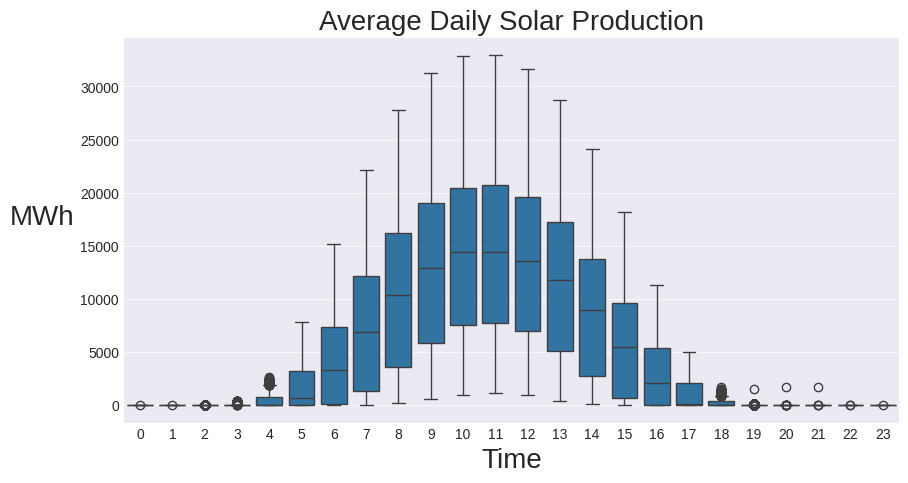

In [ ]:
# Create a boxplot of the average solar generation production
plt.figure(figsize=(10,5))
sns.boxplot(x=DE_energy['hour'], y=DE_energy['DE_solar_generation_actual'])

# Remove top, left, right, and bottom spines for a cleaner appearance
plt.gca().spines['top'].set_visible(False)
plt.gca().spines['left'].set_visible(False)
plt.gca().spines['right'].set_visible(False)
plt.gca().spines['bottom'].set_visible(False)

# Set grid and axis appearance
plt.gca().set_axisbelow(True)
plt.gca().grid(axis='y', alpha=0.7)

# Title and labels
plt.title('Average Daily Solar Production', fontsize=20)
plt.xlabel('Time', fontsize=20)
plt.ylabel("MWh", rotation=0, ha='right', fontsize=20) # Changed rotation='0' to rotation=0

plt.show()

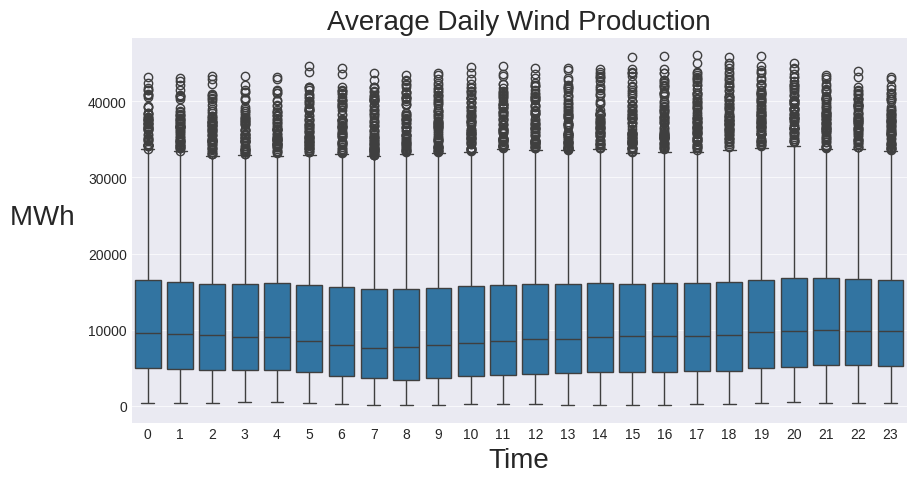

In [ ]:
# Lets repeat the process for wind.

plt.figure(figsize=(10,5))
# Pass the data as a DataFrame and specify x and y as keyword arguments
sns.boxplot(x='hour', y='DE_wind_generation_actual', data=DE_energy)
plt.gca().spines['top'].set_visible(False)
plt.gca().spines['left'].set_visible(False)
plt.gca().spines['right'].set_visible(False)
plt.gca().spines['bottom'].set_visible(False)
plt.gca().set_axisbelow(True)
plt.gca().grid(axis='y',alpha=.7)

plt.title('Average Daily Wind Production',fontsize=20)

plt.xlabel('Time', fontsize=20)

plt.ylabel("MWh ",rotation=0,ha='right', fontsize=20) # Changed rotation='0' to rotation=0
plt.show()

In [ ]:
# use the resample function to average the generation over all the days
energy_all = energy_all.resample('D').mean()

In [ ]:
energy_all.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 2101 entries, 2014-12-31 00:00:00+00:00 to 2020-09-30 00:00:00+00:00
Freq: D
Data columns (total 2 columns):
 #   Column                      Non-Null Count  Dtype  
---  ------                      --------------  -----  
 0   DE_solar_generation_actual  2101 non-null   float64
 1   DE_wind_generation_actual   2101 non-null   float64
dtypes: float64(2)
memory usage: 49.2 KB


In [ ]:
energy_all.shape

(2101, 2)

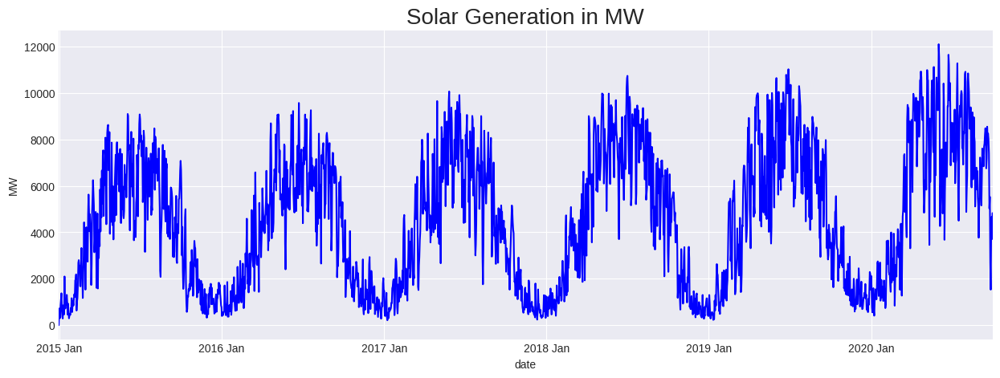

In [ ]:
# visualize the time time series of solar
plt.figure(figsize=(15,5))
plt.plot(energy_all['DE_solar_generation_actual'],color='blue')
plt.title('Solar Generation in MW', fontsize=20)
plt.ylabel('MW')
plt.xlabel('date')
ax = plt.gca()

ax.autoscale(enable=True, axis='x', tight=True)
ax.xaxis.set_major_formatter(DateFormatter("%Y %b"))
plt.show()

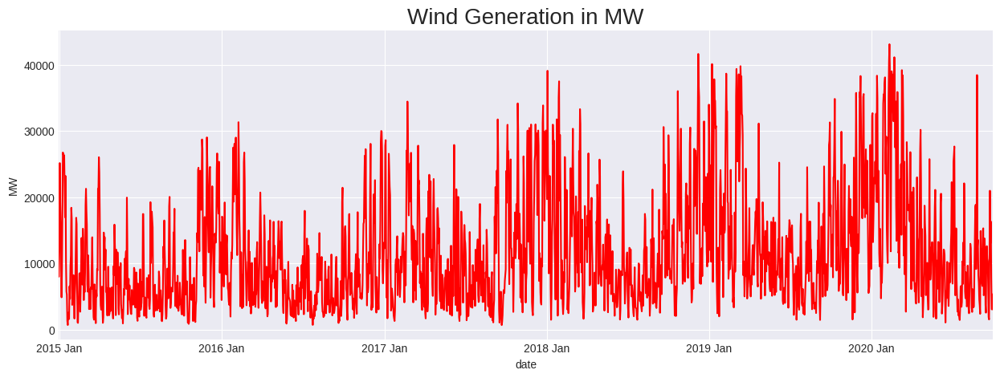

In [ ]:
# Do the same thing for the wind data
plt.figure(figsize=(15,5))
plt.plot(energy_all['DE_wind_generation_actual'], c='red')
plt.title('Wind Generation in MW', fontsize=20)
plt.ylabel('MW')
plt.xlabel('date')
ax = plt.gca()

ax.autoscale(enable=True, axis='x', tight=True)
ax.xaxis.set_major_formatter(DateFormatter("%Y %b"))
plt.show()

In [ ]:
# Lets check out some basic statistics for the data
energy_all.describe()

,DE_solar_generation_actual,DE_wind_generation_actual
count,2101.000000,2101.000000
mean,4560.358520,11550.603284
std,2903.106344,8409.260678
min,0.000000,686.750000
25%,1763.458333,5182.708333
50%,4498.166667,9101.625000
75%,6916.333333,15790.500000
max,12101.208333,43086.875000


# Solar Exploratory Analaysis  
This is for the ARIMA model

In [ ]:
# Create a series for the solar generation
solar_power = energy_all['DE_solar_generation_actual']

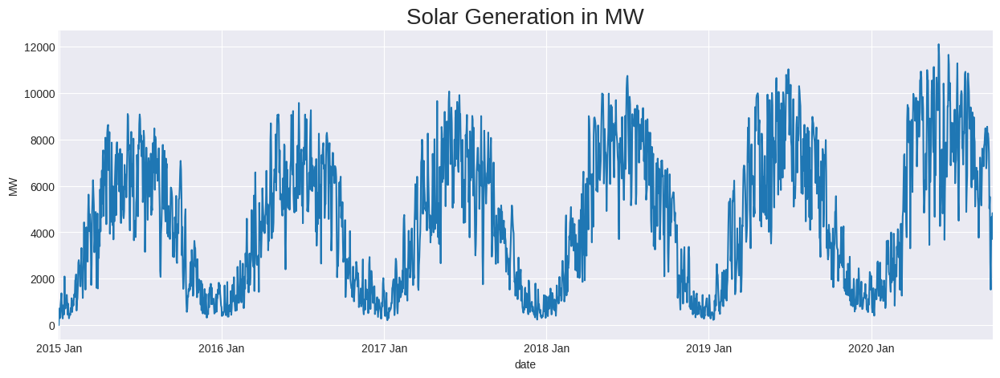

In [ ]:
# Lets take a look at the time series again to get a good shape
plt.figure(figsize=(15,5))
plt.plot(solar_power)
plt.title('Solar Generation in MW', fontsize=20)
plt.ylabel('MW')
plt.xlabel('date')
ax = plt.gca()

ax.autoscale(enable=True, axis='x', tight=True)
ax.xaxis.set_major_formatter(DateFormatter("%Y %b"))
plt.show()

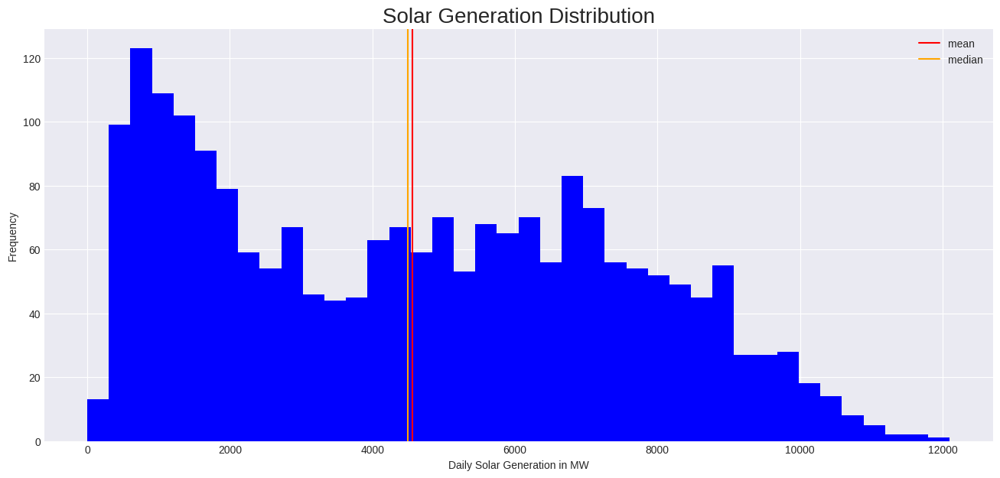

In [ ]:
# Plot distribution
plt.figure()
plt.hist(solar_power, bins=40,color="blue")
plt.title('Solar Generation Distribution', fontsize=20)
plt.ylabel('Frequency')
plt.xlabel('Daily Solar Generation in MW')
plt.axvline(solar_power.mean(), c='red', label ='mean')
plt.axvline(solar_power.median(), c='orange', label ='median')
plt.legend()

plt.show()

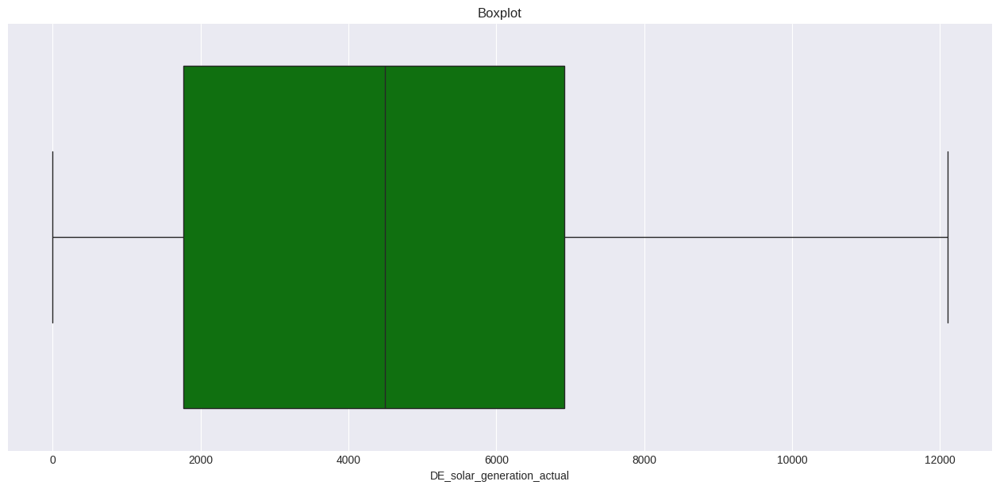

In [ ]:
sns.boxplot(x=solar_power, color="green")
plt.title('Boxplot')


plt.show()

In [ ]:
solar_power.describe()

,DE_solar_generation_actual
count,2101.000000
mean,4560.358520
std,2903.106344
min,0.000000
25%,1763.458333
50%,4498.166667
75%,6916.333333
max,12101.208333


In [ ]:
# Check the decomposition of the solar power data
from statsmodels.api import tsa
decomposition = tsa.seasonal_decompose(solar_power, period=365, model='additive')

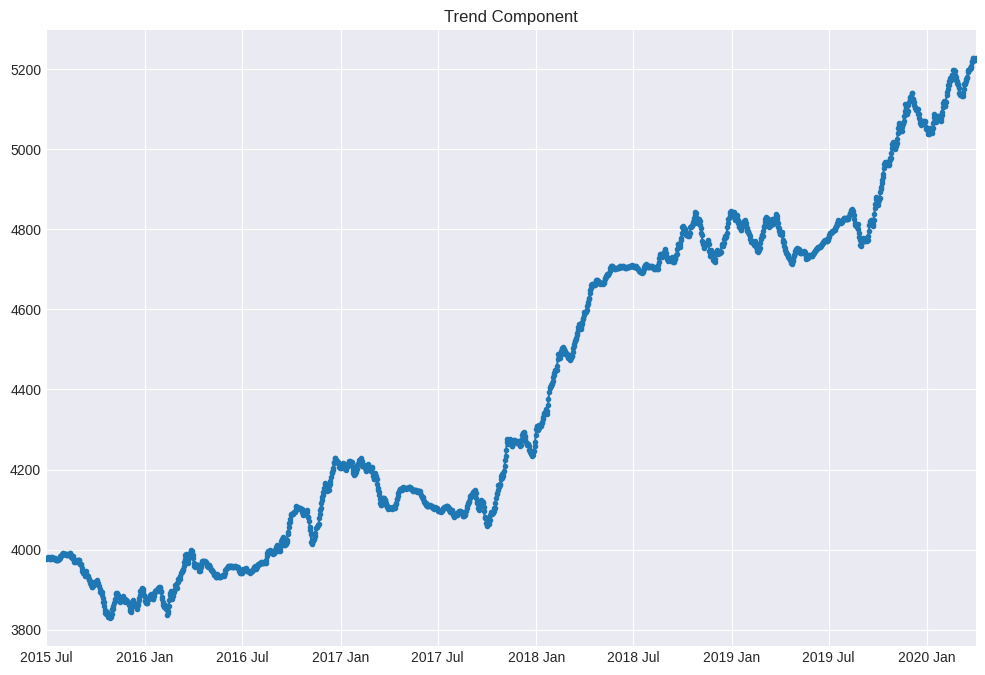

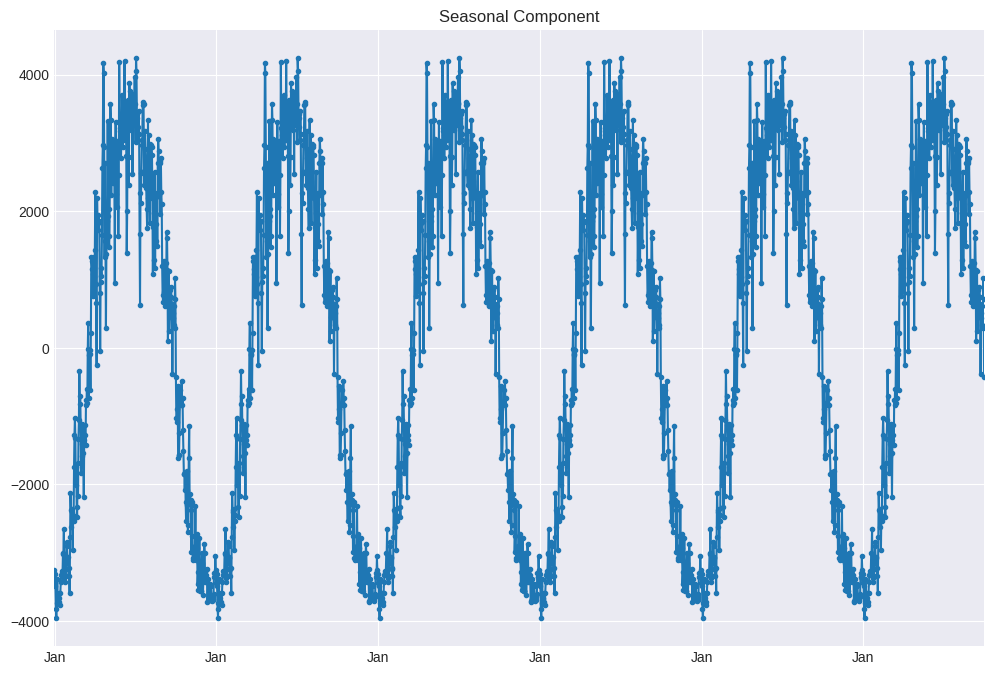

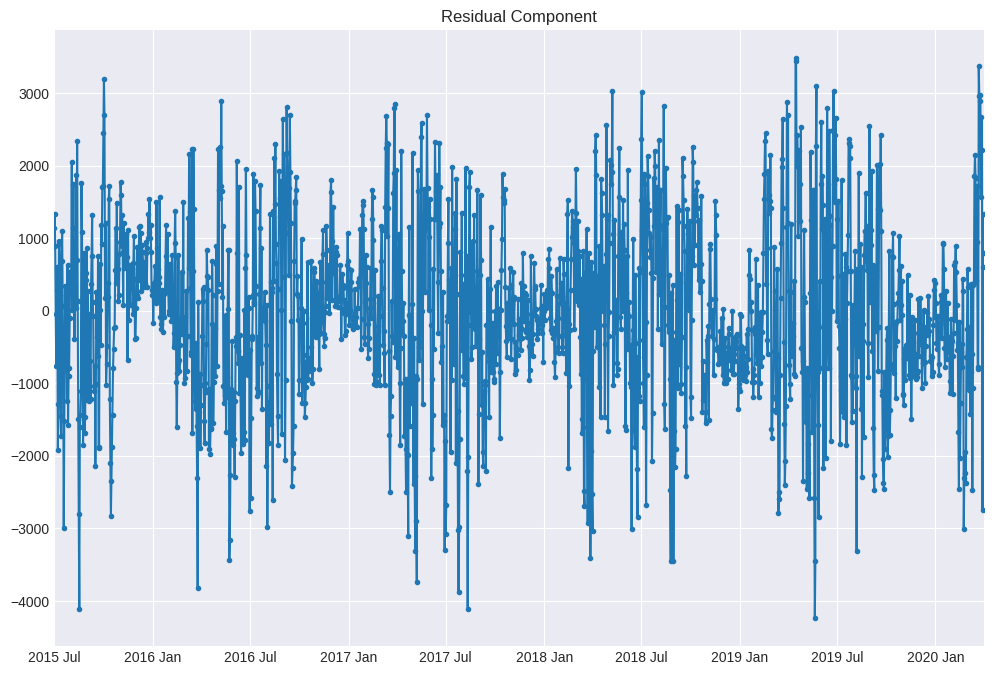

In [ ]:
import matplotlib.dates as mdates
# Trend
plt.figure(figsize=(12,8))
plt.plot(decomposition.trend, marker='.')
plt.title('Trend Component')
ax = plt.gca()

ax.autoscale(enable=True, axis='x', tight=True)
ax.xaxis.set_major_formatter(DateFormatter("%Y %b"))
plt.show();

# Seasonal component
plt.figure(figsize=(12,8))
plt.plot(decomposition.seasonal, marker='.')
plt.title('Seasonal Component')
ax = plt.gca()

ax.autoscale(enable=True, axis='x', tight=True)
ax.xaxis.set_major_formatter(DateFormatter("%b"))
plt.show();

# Residuals
plt.figure(figsize=(12,8))
plt.plot(decomposition.resid, marker='.')
plt.title('Residual Component')
ax = plt.gca()

ax.autoscale(enable=True, axis='x', tight=True)
ax.xaxis.set_major_formatter(DateFormatter("%Y %b"))
plt.show();

# Stationary Check - Solar



In [ ]:
s = adfuller(solar_power, regression='ct')
print('p-value:{}'.format(s[1]))

p-value:0.20197389843739444


In [ ]:
# Lets check the differencce
s = adfuller(solar_power.diff().dropna(), regression='c')
print('p-value:{}'.format(s[1]))

p-value:1.267633890059286e-27


In [ ]:
# KPSS test
from statsmodels.tsa.stattools import kpss
def kpss_test(solar_power, **kw):
    statistic, p_value, n_lags, critical_values = kpss(solar_power, **kw)
    # Format Output
    print(f'KPSS Statistic: {statistic}')
    print(f'p-value: {p_value}')
    print(f'num lags: {n_lags}')
    print('Critial Values:')
    for key, value in critical_values.items():
        print(f'   {key} : {value}')
    print(f'Result: The series is {"not " if p_value < 0.05 else ""}stationary')

kpss_test(solar_power)

KPSS Statistic: 0.5037632235285787
p-value: 0.04081909379986966
num lags: 27
Critial Values:
   10% : 0.347
   5% : 0.463
   2.5% : 0.574
   1% : 0.739
Result: The series is not stationary


In [ ]:
# lets test it around the trend using ct, this will be a better test to use because of the actual trend of the data in the graphs above
kpss_test(solar_power, regression='ct')

KPSS Statistic: 0.08926524842232693
p-value: 0.1
num lags: 27
Critial Values:
   10% : 0.119
   5% : 0.146
   2.5% : 0.176
   1% : 0.216
Result: The series is stationary


### Conclusion about Stationary

### Finding the order of differencing for the ARIMA model

In [ ]:
# check the time series
solar_power

,DE_solar_generation_actual
utc_timestamp,
2014-12-31 00:00:00+00:00,0.000000
2015-01-01 00:00:00+00:00,712.416667
2015-01-02 00:00:00+00:00,323.208333
2015-01-03 00:00:00+00:00,301.541667
2015-01-04 00:00:00+00:00,832.583333
...,...
2020-09-26 00:00:00+00:00,1527.083333
2020-09-27 00:00:00+00:00,4035.666667
2020-09-28 00:00:00+00:00,4656.791667


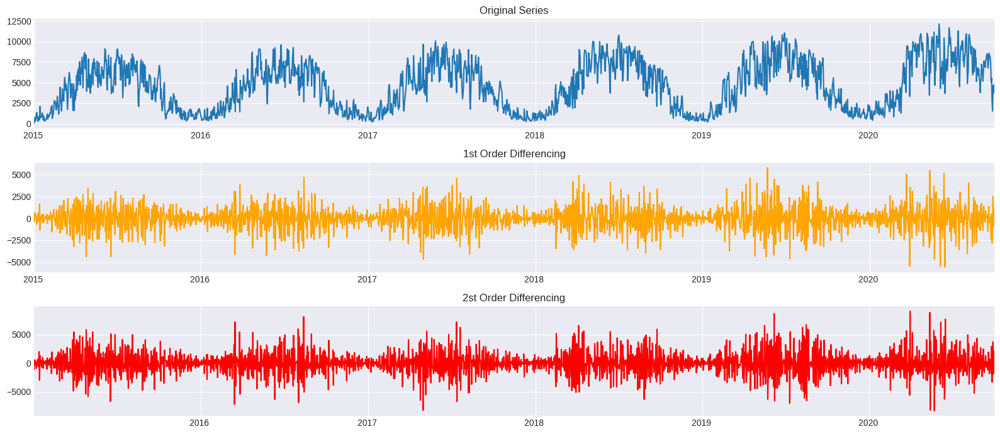

In [ ]:
# Lets take a look at the timeseries compared to when we take the 1st and 2nd difference
from statsmodels.graphics.tsaplots import plot_acf
from statsmodels.graphics.tsaplots import plot_pacf

plt.subplots(3, 1)

# orginal series
plt.subplot(3,1,1)
plt.plot(solar_power)
plt.title('Original Series')
ax = plt.gca()
ax.autoscale(enable=True, axis='x', tight=True)
ax.xaxis.set_major_formatter(DateFormatter("%Y "))

plt.subplot(3,1,2)
plt.plot(solar_power.diff().dropna(), c='orange')
plt.title('1st Order Differencing')
ax = plt.gca()
ax.autoscale(enable=True, axis='x', tight=True)
ax.xaxis.set_major_formatter(DateFormatter("%Y "))


plt.subplot(3,1,3)
plt.plot(solar_power.diff().diff().dropna(), c='red')
plt.title('2st Order Differencing')
ax = plt.gca()
ax.autoscale(enable=True, axis='x', tight=True)
ax.xaxis.set_major_formatter(DateFormatter("%Y "))

plt.tight_layout()
plt.show()

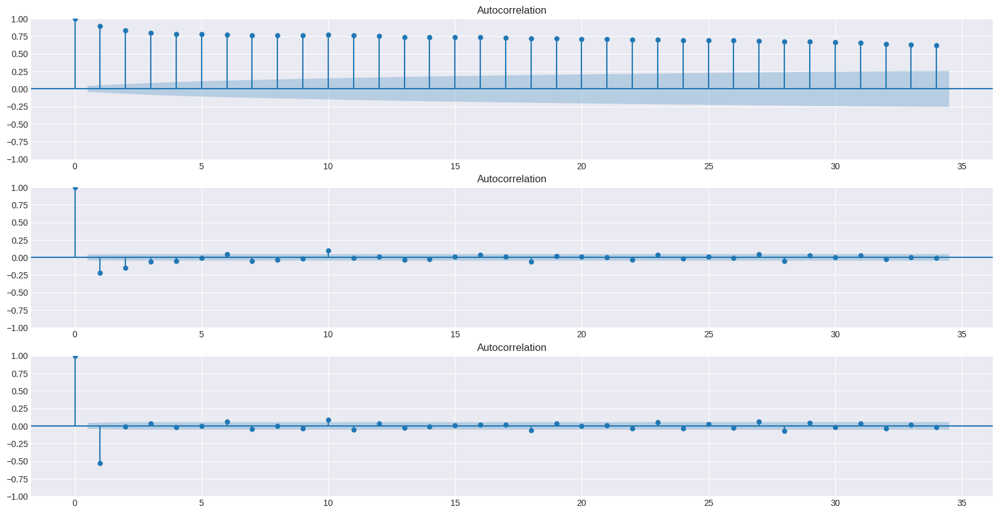

In [ ]:
# Visualize the autocorrelation plots so that we can get a better idea of differencing.
fig,ax = plt.subplots(3,1,figsize=(20,10))
fig = plot_acf(solar_power, ax=ax[0])
fig = plot_acf(solar_power.diff().dropna(), ax=ax[1])
fig = plot_acf(solar_power.diff().diff().dropna(), ax=ax[2])

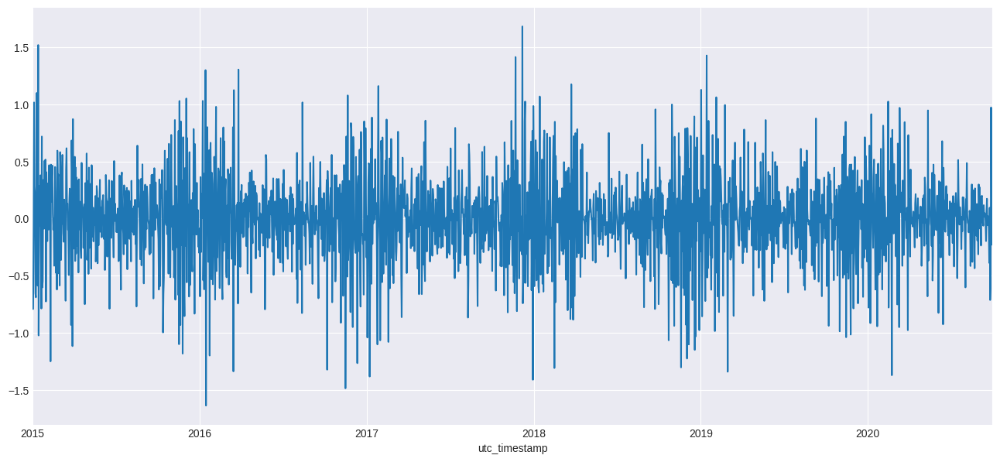

In [ ]:
# ANother option would be to do a log transformation to deal with trend being statoinary but not strict stationary.
np.log(solar_power).diff().dropna().plot()
plt.show()

In [ ]:
solar_log= np.log(solar_power).diff().dropna()

## Finding order of the AR term
For the ARIMA model we need to first find the the order (p,d,q). To find the first p order, it is good to look at the Partial auto correlation plot

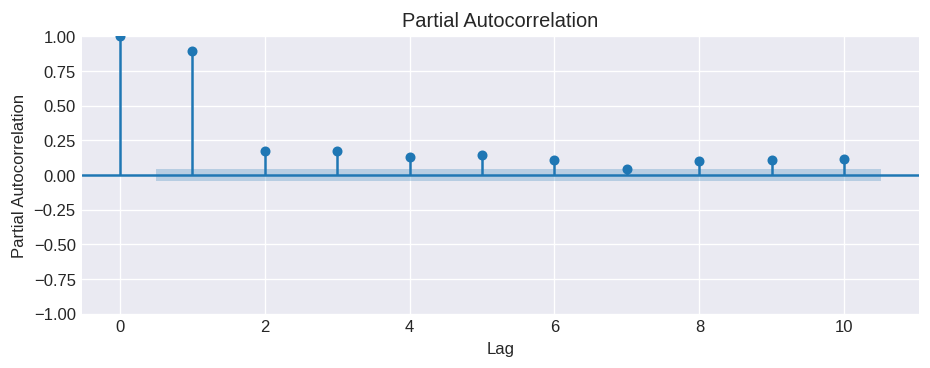

In [ ]:
# Plot the PACF
from statsmodels.graphics.tsaplots import plot_pacf
plt.rcParams.update({'figure.figsize':(9,3),'figure.dpi':120})


plot_pacf(solar_power, lags=10)
plt.xlabel('Lag')
plt.ylabel('Partial Autocorrelation')
plt.show()

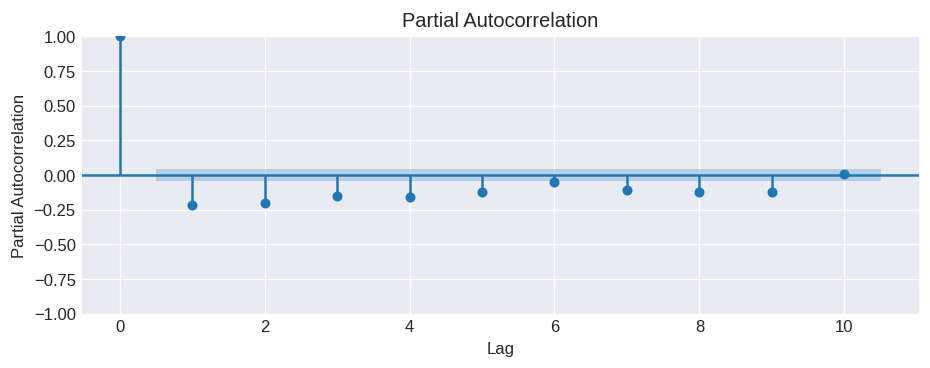

In [ ]:
# lets check the differened one as well
plt.rcParams.update({'figure.figsize':(9,3),'figure.dpi':120})


plot_pacf(solar_power.diff().dropna(), lags=10)
plt.xlabel('Lag')
plt.ylabel('Partial Autocorrelation')
plt.show()

It ooks like setting p = 2 looks like a good answer from both the plots.

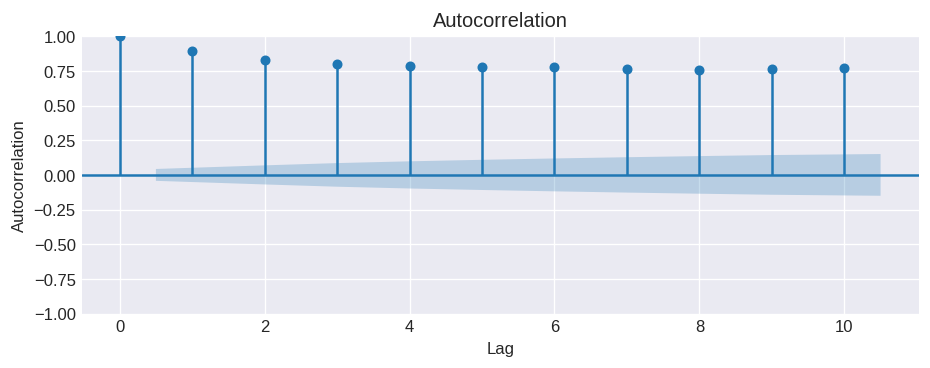

In [ ]:
# to find the q value, it is helpful to look at the autocorrelation plot
from statsmodels.graphics.tsaplots import plot_acf
plot_acf(solar_power, lags=10)
plt.xlabel('Lag')
plt.ylabel('Autocorrelation')
plt.show()

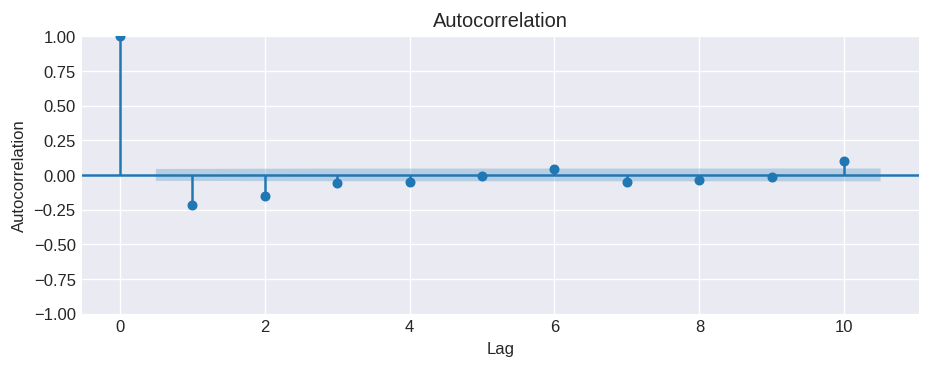

In [ ]:
from statsmodels.graphics.tsaplots import plot_acf
plot_acf(solar_power.diff().dropna(), lags=10)
plt.xlabel('Lag')
plt.ylabel('Autocorrelation')
plt.show()

It looks likes 3 is the best answer for q=3.

In [ ]:
# import ARMA order select from stats model to figure out the best one
from statsmodels.tsa.stattools import arma_order_select_ic as aosi
resDiff = aosi(solar_power, max_ar=7, max_ma=7, ic='aic', trend='c')
print('ARMA(p,q) =',resDiff['aic_min_order'],'is the best.')


ARMA(p,q) = (7, 7) is the best.


### Train and test

In [ ]:
# split the data into train and test set using .....

test_percent = .15
test_number = int(solar_power.shape[0]*test_percent)
train_s = solar_power[:-test_number]
test_s = solar_power[-test_number:]

In [ ]:
train_s.shape

(1786,)

In [ ]:
test_s.shape

(315,)

In [ ]:
# will need this package for later to get a good sense of the
from sklearn.metrics import mean_absolute_error

In [ ]:
#test_percent = .05
#test_number = int(solar_log.shape[0]*test_percent)
#train_s = solar_log[:-test_number]
#test_s = solar_log[-test_number:]

## ARIMA MODEL

In [ ]:

#ARIMA MODEL
from statsmodels.tsa.statespace.sarimax import SARIMAX

model_s = SARIMAX(train_s, order=(6,1,6),
                enforce_stationarity=False,
                enforce_invertibility=False,
                trend="t") # order of _ for AR, 1 differentiation, and _ for MA
model_fit_s = model_s.fit(maxiter=2000)

print('Coefficients: %s' % model_fit_s.params)

Coefficients: drift    -6.989526e-03
ar.L1    -7.986604e-01
ar.L2    -1.861875e-01
ar.L3    -7.480784e-01
ar.L4    -1.102142e-01
ar.L5     3.746427e-01
ar.L6    -5.944901e-02
ma.L1     4.030802e-01
ma.L2    -3.558945e-01
ma.L3     3.964992e-01
ma.L4    -3.724837e-01
ma.L5    -6.538972e-01
ma.L6     1.530072e-01
sigma2    1.425539e+06
dtype: float64


RMSE:  520.8006378577562


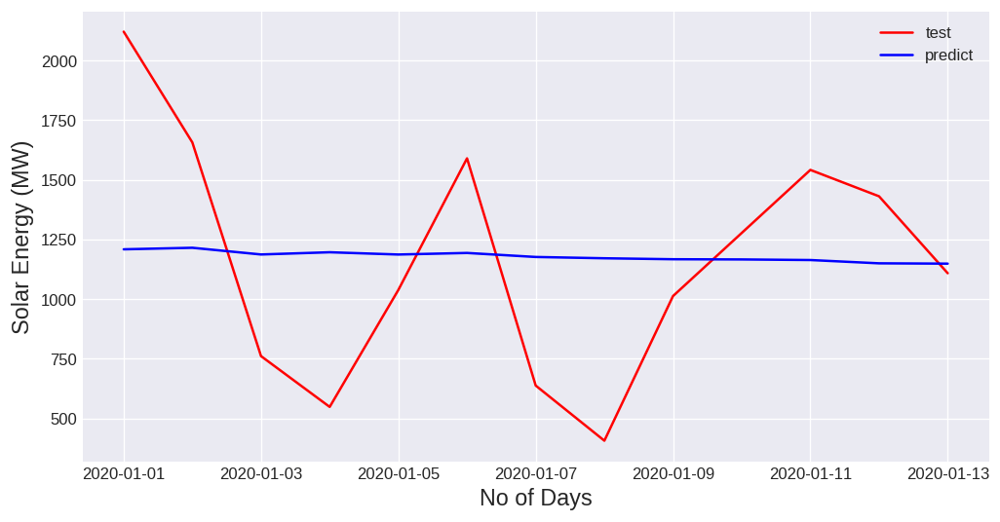

In [ ]:
from sklearn.metrics import mean_squared_error
from math import sqrt
import matplotlib.dates as mdates
import pandas as pd

# ... (your previous code) ...

predictions = model_fit_s.predict(start=len(train_s), end=len(train_s)+len(test_s)-1, typ="levels", index=test_s.index)

print("RMSE: ", sqrt(mean_squared_error(test_s[:14], predictions[:14])))

plt.figure(figsize=(10,5))

# Filter data for the desired date range
start_date = pd.to_datetime('2020-01-01').tz_localize('UTC')  # Make start_date timezone-aware
end_date = pd.to_datetime('2020-01-13').tz_localize('UTC')    # Make end_date timezone-aware
filtered_test_s = test_s[(test_s.index >= start_date) & (test_s.index <= end_date)]
filtered_predictions = predictions[(predictions.index >= start_date) & (predictions.index <= end_date)]

# Plot the filtered data
plt.plot(filtered_test_s.index, filtered_test_s.values, c="red", label="test")
plt.plot(filtered_predictions.index, filtered_predictions.values, c="blue", label="predict")

plt.legend()
plt.ylabel("Solar Energy (MW)", fontsize=14)  # X-axis label
plt.xlabel("No of Days", fontsize=14)

# Format the x-axis to display dates in "YYYY-MM-DD" format
# and show labels for alternative days
plt.gca().xaxis.set_major_formatter(mdates.DateFormatter('%Y-%m-%d'))
plt.gca().xaxis.set_major_locator(mdates.DayLocator(interval=2))  # Show every other day

plt.show();

Not that great lets check the mean apsolute error

In [ ]:
from sklearn.metrics import mean_absolute_error
print("MAE: ", mean_absolute_error(test_s[:14], predictions[:14]))

MAE:  404.6559683060486


In [ ]:
from sklearn.metrics import mean_squared_error, r2_score
from math import sqrt
rmse = sqrt(mean_squared_error(test_s[:14], predictions[:14]))
print("RMSE: ", rmse)

# Compute R-squared Score (R²)
r2 = r2_score(test_s[:14], predictions[:14])
print("R-squared Score: ", r2)

RMSE:  520.8006378577562
R-squared Score:  0.012276962699090843


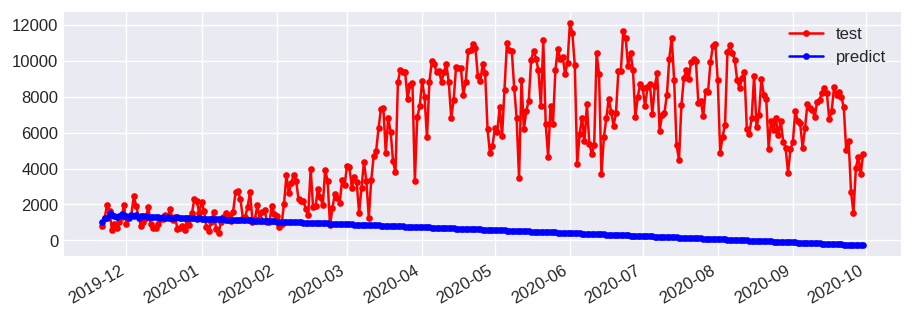

In [ ]:
# make prediction
predictions = model_fit_s.predict(start=len(train_s), end=len(train_s)+len(test_s)-1, typ="levels", index=test_s.index)

fig = plt.figure()
plt.plot(test_s, c="red", label="test", marker='.')
plt.plot(predictions, c="blue", label="predict", marker='.')
plt.legend()
fig.autofmt_xdate()
plt.show();

In [ ]:
# Run a loop throgh the model to find the best parameters
best_MAE = float('inf')

for p in range(1,7):
    for d in range(0,2):
        for q in range(1,7):

            print(f"Trying values of {(p,d,q)}",end = "\r")

            model = SARIMAX(train_s,order = (p,d,q),
                           enforce_stationary = False,
                           enforce_invertibility = False,
                           trend = "t")

            model_fit = model.fit(maxiter = 2000)

            predictions = model_fit.predict(start=len(train_s),end = len(train_s) + len(test_s) - 1,typ="levels", index=test_s.index)

            current_MAE = mean_absolute_error(test_s[:10],predictions[:10])

            if (best_MAE > current_MAE):
                best_MAE = current_MAE
                print(f"Found new best MAE of {best_MAE} with values {(p,d,q)}")

Found new best MAE of 784.4641727043473 with values (1, 0, 1)
Found new best MAE of 489.1680633561783 with values (1, 0, 2)
Found new best MAE of 446.22735406804924 with values (1, 1, 1)
Found new best MAE of 438.8828146646826 with values (1, 1, 2)
Found new best MAE of 436.66381577069006 with values (1, 1, 3)
Found new best MAE of 436.49668252054414 with values (1, 1, 5)
Found new best MAE of 411.98097115070124 with values (1, 1, 6)
Found new best MAE of 376.515928243715 with values (2, 1, 5)
Found new best MAE of 375.8117298539254 with values (5, 1, 4)


# F-Prophet


In [ ]:
# what prophet does

# y(t) = T(t) + S(t) + H(t)


In [ ]:
# set up data for prohpet
dfs = pd.DataFrame(solar_power)
dfs

,DE_solar_generation_actual
utc_timestamp,
2014-12-31 00:00:00+00:00,0.000000
2015-01-01 00:00:00+00:00,712.416667
2015-01-02 00:00:00+00:00,323.208333
2015-01-03 00:00:00+00:00,301.541667
2015-01-04 00:00:00+00:00,832.583333
...,...
2020-09-26 00:00:00+00:00,1527.083333
2020-09-27 00:00:00+00:00,4035.666667
2020-09-28 00:00:00+00:00,4656.791667


In [ ]:
dfs['ds'] = solar_power.index

In [ ]:
dfs

,DE_solar_generation_actual,ds
utc_timestamp,,
2014-12-31 00:00:00+00:00,0.000000,2014-12-31 00:00:00+00:00
2015-01-01 00:00:00+00:00,712.416667,2015-01-01 00:00:00+00:00
2015-01-02 00:00:00+00:00,323.208333,2015-01-02 00:00:00+00:00
2015-01-03 00:00:00+00:00,301.541667,2015-01-03 00:00:00+00:00
2015-01-04 00:00:00+00:00,832.583333,2015-01-04 00:00:00+00:00
...,...,...
2020-09-26 00:00:00+00:00,1527.083333,2020-09-26 00:00:00+00:00
2020-09-27 00:00:00+00:00,4035.666667,2020-09-27 00:00:00+00:00
2020-09-28 00:00:00+00:00,4656.791667,2020-09-28 00:00:00+00:00


In [ ]:
dfs['ds'] = pd.to_datetime(dfs['ds']).apply(lambda x: dt.datetime.strftime(x,'%Y-%m-%d'))
dfs['ds'] = pd.to_datetime(dfs['ds'])

In [ ]:
dfs =dfs.reset_index(drop=True)
dfs

,DE_solar_generation_actual,ds
0,0.000000,2014-12-31
1,712.416667,2015-01-01
2,323.208333,2015-01-02
3,301.541667,2015-01-03
4,832.583333,2015-01-04
...,...,...
2096,1527.083333,2020-09-26
2097,4035.666667,2020-09-27
2098,4656.791667,2020-09-28
2099,3706.958333,2020-09-29


In [ ]:
# That 2014 date shouldn't be zero
dfs.drop(dfs.index[0], inplace=True)
dfs

,DE_solar_generation_actual,ds
1,712.416667,2015-01-01
2,323.208333,2015-01-02
3,301.541667,2015-01-03
4,832.583333,2015-01-04
5,1105.083333,2015-01-05
...,...,...
2096,1527.083333,2020-09-26
2097,4035.666667,2020-09-27
2098,4656.791667,2020-09-28
2099,3706.958333,2020-09-29


In [ ]:
dfs.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2100 entries, 1 to 2100
Data columns (total 2 columns):
 #   Column                      Non-Null Count  Dtype         
---  ------                      --------------  -----         
 0   DE_solar_generation_actual  2100 non-null   float64       
 1   ds                          2100 non-null   datetime64[ns]
dtypes: datetime64[ns](1), float64(1)
memory usage: 32.9 KB


In [ ]:
from prophet import Prophet # Import Prophet from prophet instead of fbprophet

In [ ]:
# Instead of using tz_convert, use tz_localize to assign a timezone first
# if you know the original timezone of your data. For example, if your data
# is in UTC, you can use:
dfs['ds'] = dfs['ds'].dt.tz_localize('UTC')
# Now you can use tz_convert to remove the timezone:
dfs['ds'] = dfs['ds'].dt.tz_convert(None)

In [ ]:
dfs.rename(columns={'DE_solar_generation_actual': 'y'},inplace=True)

In [ ]:
dfs.head()

,y,ds
1,712.416667,2015-01-01
2,323.208333,2015-01-02
3,301.541667,2015-01-03
4,832.583333,2015-01-04
5,1105.083333,2015-01-05


(2100, 2)


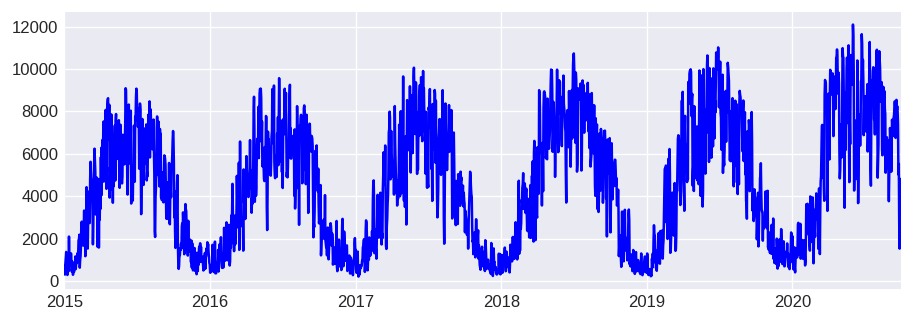

In [ ]:

print(dfs.shape)
plt.figure()
plt.plot(dfs['ds'], dfs['y'],c="blue")
plt.autoscale(enable=True, axis='x', tight=True)
plt.show();

In [ ]:
# Split the data up

train = dfs.loc[dfs.ds.dt.year < 2020,:]
test = dfs.loc[dfs.ds.dt.year >= 2020, :]
test_number = 274
print(train.shape, test.shape)


(1826, 2) (274, 2)


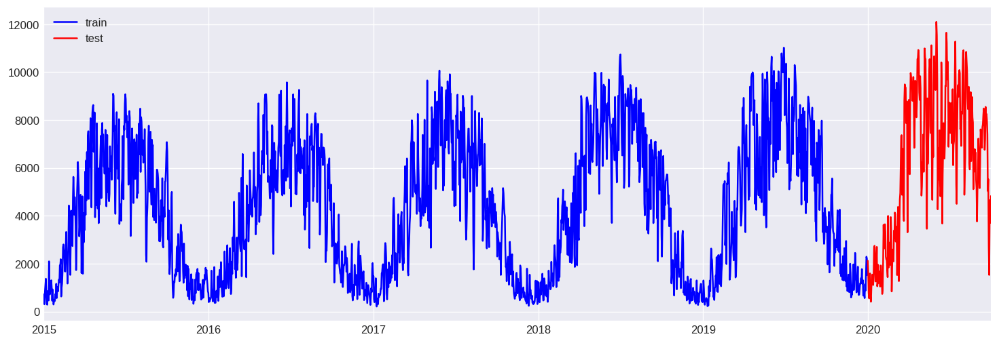

In [ ]:
plt.figure(figsize=(15,5))
plt.plot(train['ds'],train['y'].values, c="blue", label="train")
plt.plot(test['ds'], test['y'].values, c="red", label="test")
plt.autoscale(enable=True, axis='x', tight=True)
plt.legend()
plt.show();

In [ ]:
# fit the model
model = Prophet(interval_width=0.95)
model.fit(train)

INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpbe7octaw/q_3lyp5e.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpbe7octaw/_hai2anj.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=40392', 'data', 'file=/tmp/tmpbe7octaw/q_3lyp5e.json', 'init=/tmp/tmpbe7octaw/_hai2anj.json', 'output', 'file=/tmp/tmpbe7octaw/prophet_modelwd97igrm/prophet_model-20250221085911.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
08:59:11 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
08:59:11 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


In [ ]:
# Use this prediction model to compare to the ARIMA Model
prediction_df = model.predict(test[:14])
prediction_df = prediction_df[['ds','yhat', 'yhat_lower', 'yhat_upper']]

In [ ]:

future = model.make_future_dataframe(periods=test_number, freq='D', include_history=False)

In [ ]:
forecast = model.predict(future)
forecast[['ds', 'yhat', 'yhat_lower', 'yhat_upper']].head()

,ds,yhat,yhat_lower,yhat_upper
0,2020-01-01,1507.030740,-1118.759298,4071.001010
1,2020-01-02,1457.144814,-1038.629447,3950.210644
2,2020-01-03,1441.569941,-1161.310461,4017.954924
3,2020-01-04,1431.761487,-1134.071087,4070.480701
4,2020-01-05,1524.679533,-1152.657317,4123.042637


In [ ]:
test.tail()

,y,ds
2096,1527.083333,2020-09-26
2097,4035.666667,2020-09-27
2098,4656.791667,2020-09-28
2099,3706.958333,2020-09-29
2100,4824.208333,2020-09-30


In [ ]:
from prophet.plot import plot_plotly, plot_components_plotly
import plotly.offline as py
py.init_notebook_mode()

fig = plot_plotly(model, forecast)  # This returns a plotly Figure
py.iplot(fig)

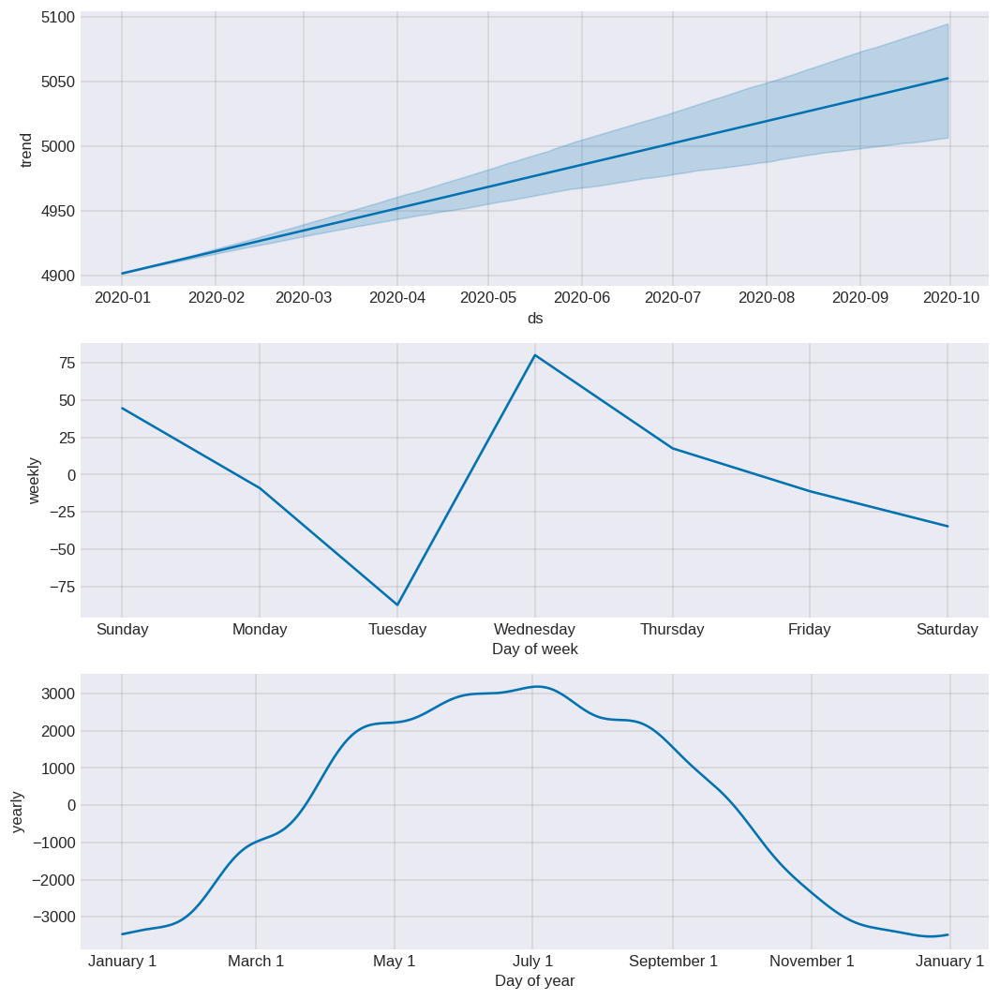

In [ ]:
model.plot_components(forecast);

In [ ]:
plot_components_plotly(model, forecast)

In [ ]:
test.info()

<class 'pandas.core.frame.DataFrame'>
Index: 274 entries, 1827 to 2100
Data columns (total 2 columns):
 #   Column  Non-Null Count  Dtype         
---  ------  --------------  -----         
 0   y       274 non-null    float64       
 1   ds      274 non-null    datetime64[ns]
dtypes: datetime64[ns](1), float64(1)
memory usage: 6.4 KB


In [ ]:
from sklearn.metrics import mean_absolute_error
print("MAE: ", mean_absolute_error(test['y'][:14], forecast['yhat'][:14]))

MAE:  464.0764142046799


In [ ]:
from sklearn.metrics import mean_squared_error
from math import sqrt
print("RMSE: ", sqrt(mean_squared_error(test['y'][:14], forecast['yhat'][:14])))

RMSE:  570.6097934109005


In [ ]:
from sklearn.metrics import r2_score
r2 = r2_score(test['y'][:14], forecast['yhat'][:14])
print("R-squared Score: ", r2)

R-squared Score:  -0.43696408627974126


## Hypermater tuning

In [ ]:
# Split the data up
dfs['cap'] = 12000 # for logistic growth
dfs.cap = np.cbrt(dfs.cap) # for logistic growth you need to set a cap
dfs.y = np.cbrt(dfs.y)


In [ ]:
train = dfs.loc[dfs.ds.dt.year < 2020,:]
test = dfs.loc[dfs.ds.dt.year >= 2020, :]
test_number = 274
print(train.shape, test.shape)

(1826, 3) (274, 3)


In [ ]:
model = Prophet(growth = 'logistic',
                interval_width=0.95,
                changepoint_range=.6,
                daily_seasonality=False,
                changepoint_prior_scale=0.05,
                seasonality_prior_scale=11,
                yearly_seasonality=150,
               )

In [ ]:
model.fit(train)

DEBUG:cmdstanpy:input tempfile: /tmp/tmpbe7octaw/9wrthib0.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpbe7octaw/g9c9n39j.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=38959', 'data', 'file=/tmp/tmpbe7octaw/9wrthib0.json', 'init=/tmp/tmpbe7octaw/g9c9n39j.json', 'output', 'file=/tmp/tmpbe7octaw/prophet_modelnxlo9k06/prophet_model-20250221085939.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
08:59:39 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
08:59:39 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


In [ ]:
# Use this prediction model to compare to the ARIMA Model
prediction_df = model.predict(test[:14])
prediction_df = prediction_df[['ds','yhat', 'yhat_lower', 'yhat_upper']]

In [ ]:
future = model.make_future_dataframe(periods=test_number, freq='D', include_history=False)
future['cap'] = 14000
future.cap = np.cbrt(future.cap)

In [ ]:
forecast = model.predict(future)
forecast[['ds', 'yhat', 'yhat_lower', 'yhat_upper']].head()

,ds,yhat,yhat_lower,yhat_upper
0,2020-01-01,11.254914,8.364374,14.423416
1,2020-01-02,10.842487,7.951730,13.833891
2,2020-01-03,9.883179,6.935325,13.037675
3,2020-01-04,9.375808,6.274694,12.488558
4,2020-01-05,9.900144,6.810930,12.802693


In [ ]:
plot_components_plotly(model, forecast)

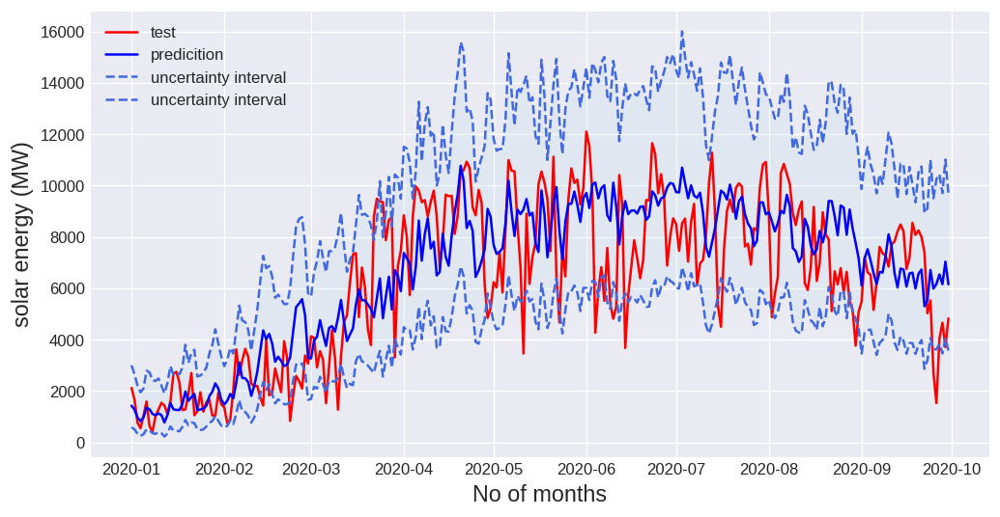

In [ ]:
train.y = train.y**3
test.y = test.y**3
forecast.yhat = forecast.yhat**3
forecast.yhat_lower = forecast.yhat_lower**3
forecast.yhat_upper = forecast.yhat_upper**3


plt.figure(figsize=(10,5))
plt.plot(test['ds'], test['y'].values, c="red", label="test")
plt.plot(test['ds'], forecast['yhat'].values, c="blue", label="predicition")
plt.plot(test['ds'], forecast['yhat_lower'].values, c="royalblue", label="uncertainty interval", linestyle='--')
plt.plot(test['ds'], forecast['yhat_upper'].values, c="royalblue", label="uncertainty interval", linestyle='--')
ax = plt.gca()
ax.fill_between(test['ds'],  forecast['yhat_lower'], forecast['yhat_upper'], facecolor='lightblue', alpha=0.15, interpolate=True)
plt.ylabel('solar energy (MW)',fontsize=14)
plt.xlabel('No of months',fontsize=14)
plt.legend()
plt.show();

ax.autoscale(enable=True, axis='x', tight=True)
ax.xaxis.set_major_formatter(DateFormatter("%Y %b"))

In [ ]:
# Redo the cubed root on the prediction function
prediction_df.yhat = prediction_df.yhat**3
prediction_df.yhat_lower = prediction_df.yhat_lower**3
prediction_df.yhat_upper = prediction_df.yhat_upper**3

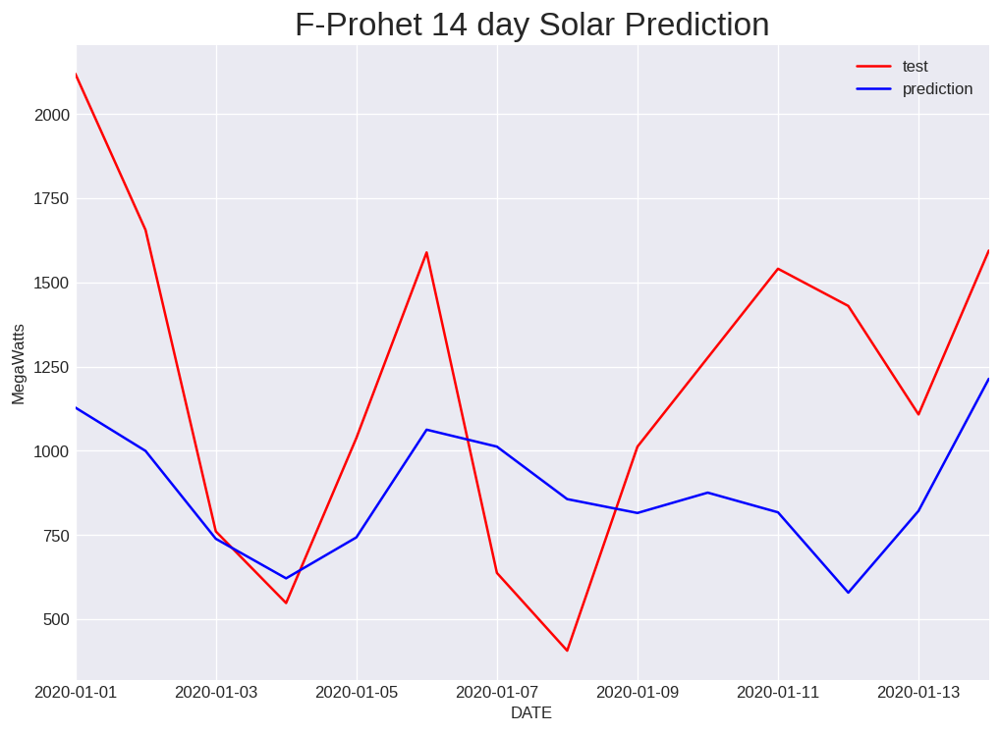

In [ ]:
plt.figure(figsize=(10,7))
plt.plot(prediction_df['ds'], test.iloc[:14].loc[:,'y'].values, c="red", label="test")
plt.plot(prediction_df['ds'], prediction_df['yhat'].values, c="blue", label="prediction")
ax = plt.gca()
plt.legend()
ax.autoscale(enable=True, axis='x', tight=True)
plt.title('F-Prohet 14 day Solar Prediction', fontsize=20)
plt.ylabel('MegaWatts')
plt.xlabel('DATE')
plt.show();

In [ ]:
from sklearn.metrics import mean_absolute_error
print("MAE: ", mean_absolute_error(test['y'][:14], forecast['yhat'][:14]))

MAE:  333.04947200833084


In [ ]:
from sklearn.metrics import mean_squared_error
from math import sqrt
print("RMSE: ", sqrt(mean_squared_error(test['y'][:14], forecast['yhat'][:14])))

RMSE:  415.6788338288741


In [ ]:
from sklearn.metrics import r2_score
r2 = r2_score(test['y'][:14], forecast['yhat'][:14])
print("R-squared Score: ", r2)

R-squared Score:  0.23742371781410998


These are the best numbers we have been able to receive so far. A mean absolute error of 333.4 means that we are on average off by 333 MW in terms of predicting the next 14 days against the test set. These numbers may seem large however if this model was applied to a much a smaller

# WIND ENERGY - EDA
Many of these steps are the same for the solar.

In [ ]:
# create a wind_power series
wind_power = energy_all['DE_wind_generation_actual']

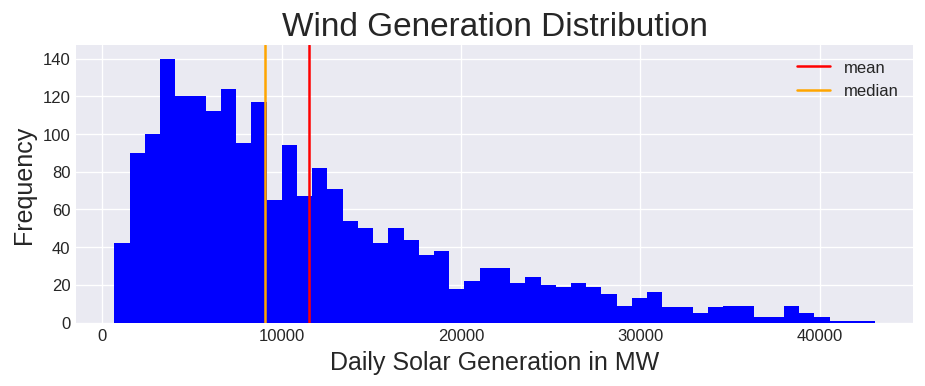

In [ ]:
plt.figure()
plt.hist(wind_power, bins=50,color="blue")
plt.title('Wind Generation Distribution', fontsize=20)
plt.ylabel('Frequency', fontsize=15)
plt.xlabel('Daily Solar Generation in MW',fontsize=15)
plt.axvline(wind_power.mean(), c='red', label ='mean')
plt.axvline(wind_power.median(), c='orange', label ='median')
plt.legend()

plt.show()

Heavily skewed right. The median and mean are very different.

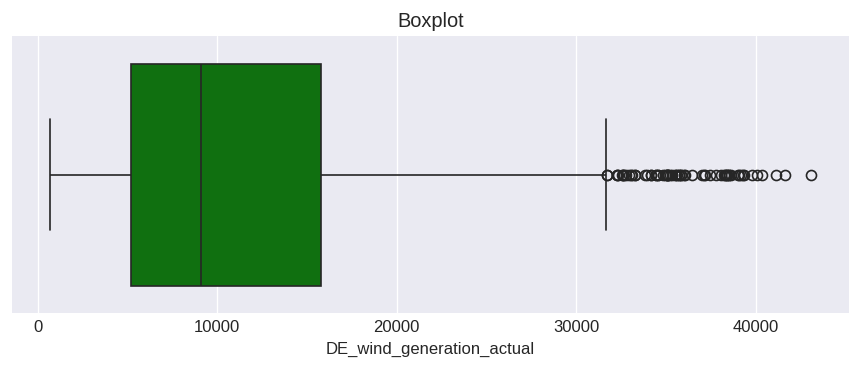

In [ ]:
sns.boxplot(x=wind_power, color="green")
plt.title('Boxplot')


plt.show()

It appears we have lots of outliers. Much different than solar power.

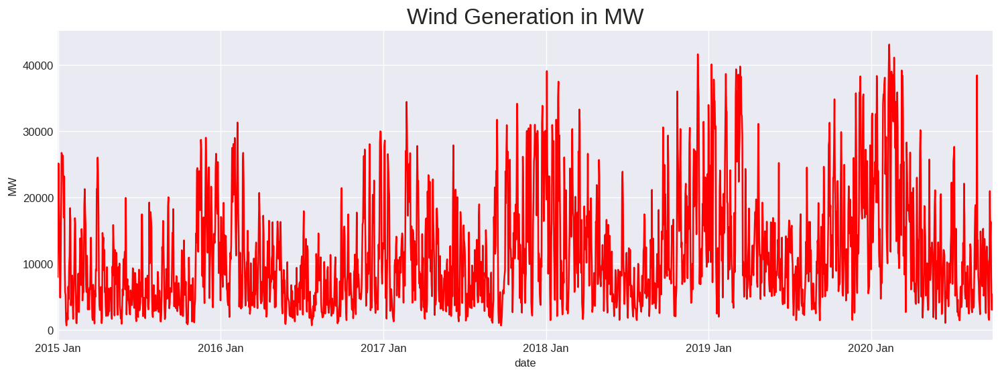

In [ ]:
plt.figure(figsize=(15,5))
plt.plot(wind_power, c='red')
plt.title('Wind Generation in MW', fontsize=20)
plt.ylabel('MW')
plt.xlabel('date')
ax = plt.gca()

ax.autoscale(enable=True, axis='x', tight=True)
ax.xaxis.set_major_formatter(DateFormatter("%Y %b"))
plt.show()

This appears to have a lot more noise then solar. I see a little bit of trend going up

In [ ]:
# Check the decomposition of the wind power data
from statsmodels.api import tsa
decomposition = tsa.seasonal_decompose(wind_power, period=365, model='additive')

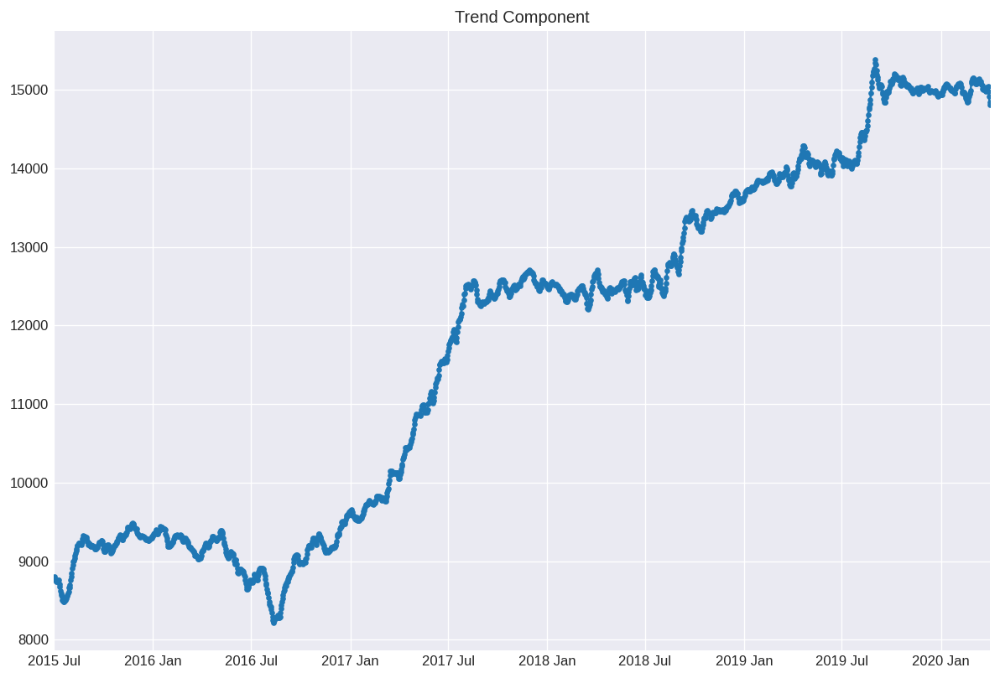

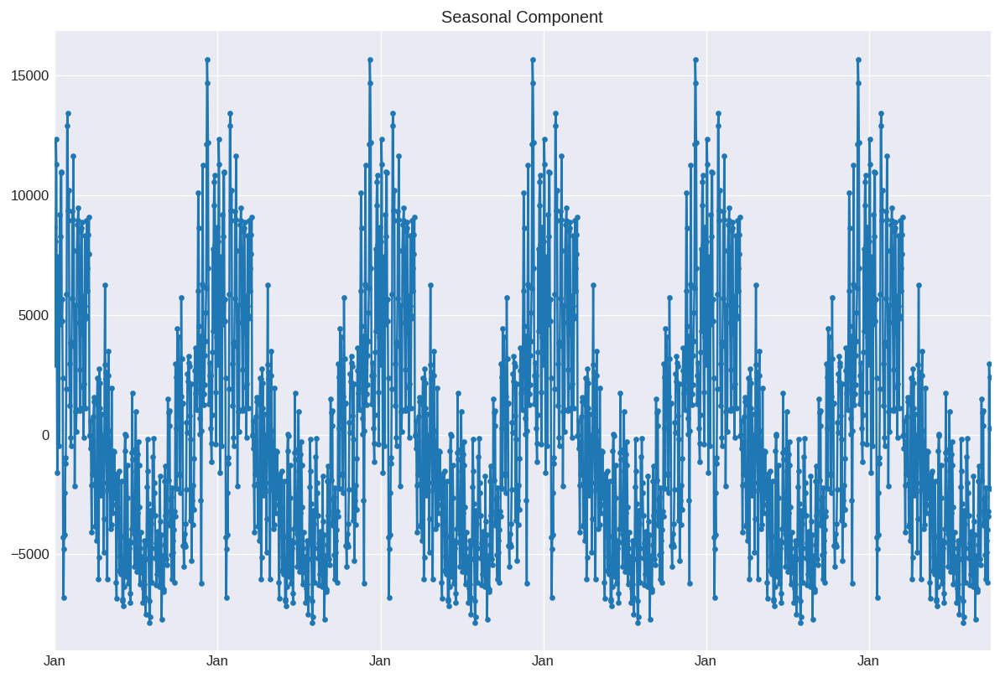

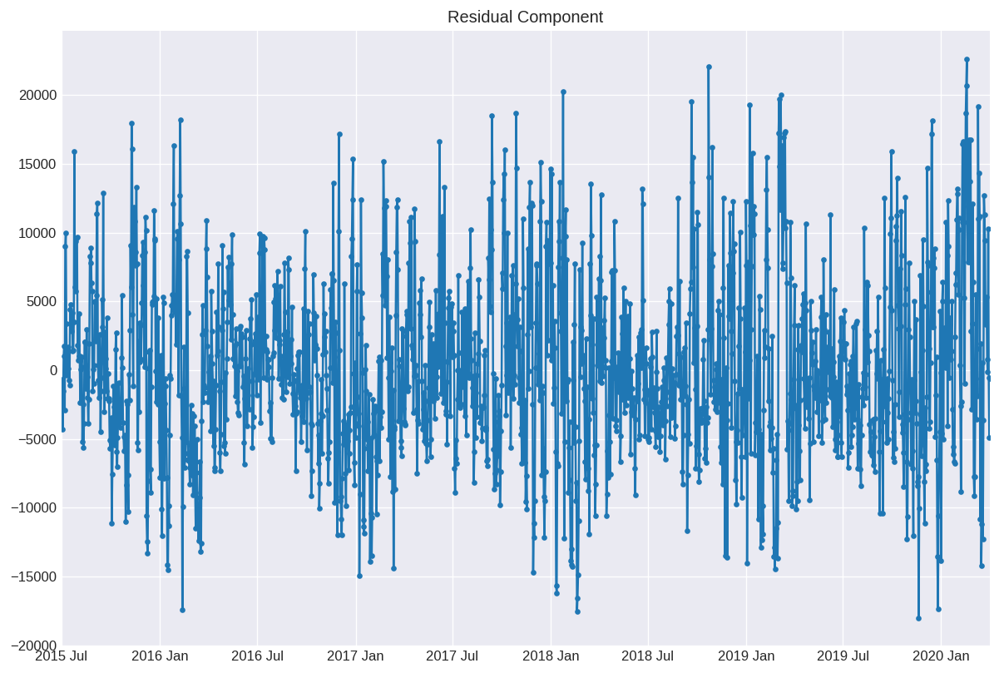

In [ ]:
import matplotlib.dates as mdates
# Trend
plt.figure(figsize=(12,8))
plt.plot(decomposition.trend, marker='.')
plt.title('Trend Component')
ax = plt.gca()

ax.autoscale(enable=True, axis='x', tight=True)
ax.xaxis.set_major_formatter(DateFormatter("%Y %b"))
plt.show();

# Seasonal component
plt.figure(figsize=(12,8))
plt.plot(decomposition.seasonal, marker='.')
plt.title('Seasonal Component')
ax = plt.gca()

ax.autoscale(enable=True, axis='x', tight=True)
ax.xaxis.set_major_formatter(DateFormatter("%b"))
plt.show();

# Residuals
plt.figure(figsize=(12,8))
plt.plot(decomposition.resid, marker='.')
plt.title('Residual Component')
ax = plt.gca()

ax.autoscale(enable=True, axis='x', tight=True)
ax.xaxis.set_major_formatter(DateFormatter("%Y %b"))
plt.show();

We see a clear rising linear trend which should be expected because Germany is increasing there Wind Farms across the country at a very fast pace. The seasonality is similar to solar except that the peak season is in January rather than summer.

# Stationary Check

$ H_0 : \text{Series has a unit root and hence is not stationary}  \quad vs. \quad H_1 : \text{ Series is stationary} $

In [ ]:
s = adfuller(wind_power, regression='ct')
print('p-value:{}'.format(s[1]))

p-value:0.000900353886808246


In [ ]:
# Lets check the differencce
s = adfuller(wind_power.diff().dropna(), regression='c')
print('p-value:{}'.format(s[1]))

p-value:3.205957720822535e-29


In [ ]:
# KPSS test
from statsmodels.tsa.stattools import kpss
def kpss_test(wind_power, **kw):
    statistic, p_value, n_lags, critical_values = kpss(solar_power, **kw)
    # Format Output
    print(f'KPSS Statistic: {statistic}')
    print(f'p-value: {p_value}')
    print(f'num lags: {n_lags}')
    print('Critial Values:')
    for key, value in critical_values.items():
        print(f'   {key} : {value}')
    print(f'Result: The series is {"not " if p_value < 0.05 else ""}stationary')

kpss_test(wind_power)

KPSS Statistic: 0.5037632235285787
p-value: 0.04081909379986966
num lags: 27
Critial Values:
   10% : 0.347
   5% : 0.463
   2.5% : 0.574
   1% : 0.739
Result: The series is not stationary


In [ ]:
# lets test it around the trend using ct, this will be a better test to use because of the actual trend of the data in the graphs above
kpss_test(wind_power, regression='ct')

KPSS Statistic: 0.08926524842232693
p-value: 0.1
num lags: 27
Critial Values:
   10% : 0.119
   5% : 0.146
   2.5% : 0.176
   1% : 0.216
Result: The series is stationary


### Conclusion about Stationary
The series passes the tests and appears to be stationary.

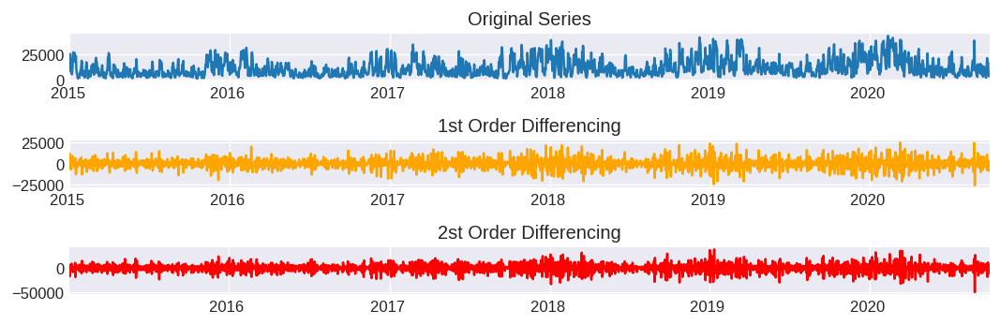

In [ ]:
from statsmodels.graphics.tsaplots import plot_acf
from statsmodels.graphics.tsaplots import plot_pacf

plt.subplots(3, 1)

# orginal series
plt.subplot(3,1,1)
plt.plot(wind_power)
plt.title('Original Series')
ax = plt.gca()
ax.autoscale(enable=True, axis='x', tight=True)
ax.xaxis.set_major_formatter(DateFormatter("%Y "))

plt.subplot(3,1,2)
plt.plot(wind_power.diff().dropna(), c='orange')
plt.title('1st Order Differencing')
ax = plt.gca()
ax.autoscale(enable=True, axis='x', tight=True)
ax.xaxis.set_major_formatter(DateFormatter("%Y "))


plt.subplot(3,1,3)
plt.plot(wind_power.diff().diff().dropna(), c='red')
plt.title('2st Order Differencing')
ax = plt.gca()
ax.autoscale(enable=True, axis='x', tight=True)
ax.xaxis.set_major_formatter(DateFormatter("%Y "))

plt.tight_layout()
plt.show()

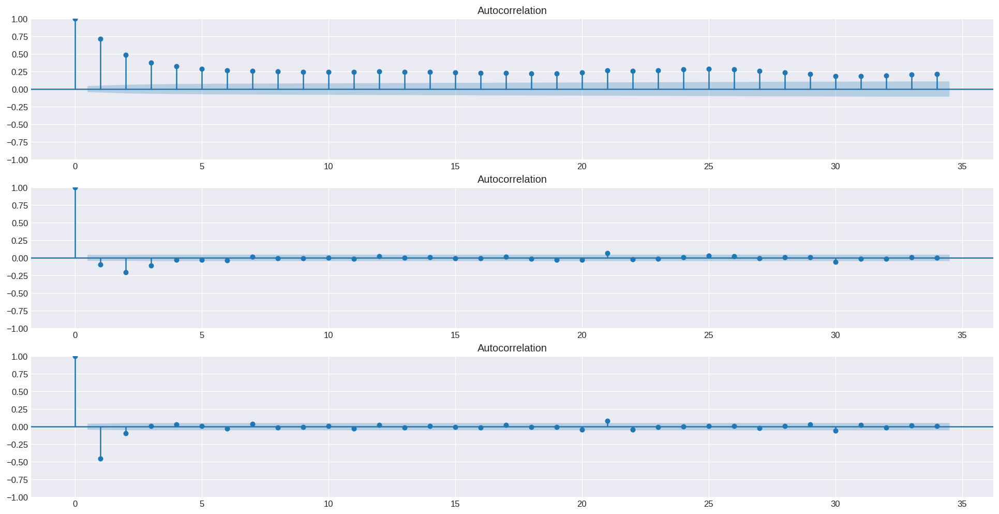

In [ ]:
# Visualize the autocorrelation plots so that we can get a better idea of differencing.
fig,ax = plt.subplots(3,1,figsize=(20,10))
fig = plot_acf(wind_power, ax=ax[0])
fig = plot_acf(wind_power.diff().dropna(), ax=ax[1])
fig = plot_acf(wind_power.diff().diff().dropna(), ax=ax[2])

## Finding order of the AR term

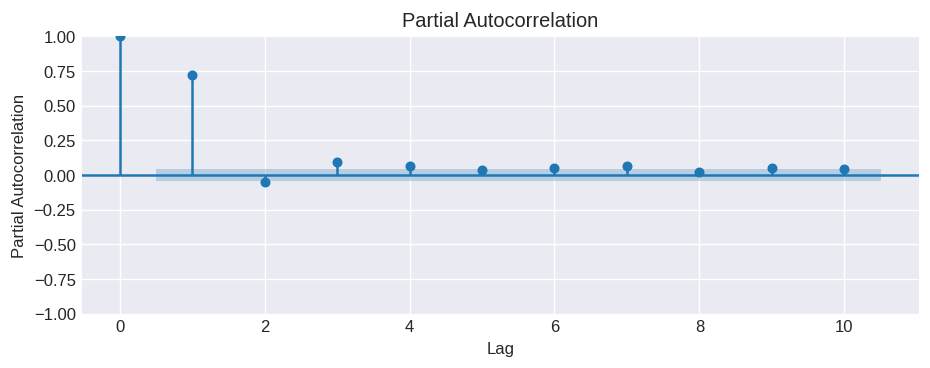

In [ ]:
# Plot the PACF
from statsmodels.graphics.tsaplots import plot_pacf
plt.rcParams.update({'figure.figsize':(9,3),'figure.dpi':120})


plot_pacf(wind_power, lags=10)
plt.xlabel('Lag')
plt.ylabel('Partial Autocorrelation')
plt.show()

p=2 looks like a good starting point based on the graph

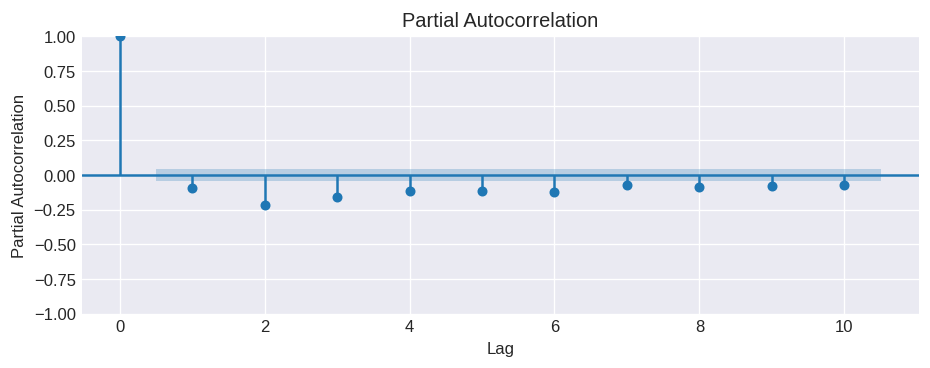

In [ ]:
# lets check the differened one as well
plt.rcParams.update({'figure.figsize':(9,3),'figure.dpi':120})


plot_pacf(wind_power.diff().dropna(), lags=10)
plt.xlabel('Lag')
plt.ylabel('Partial Autocorrelation')
plt.show()

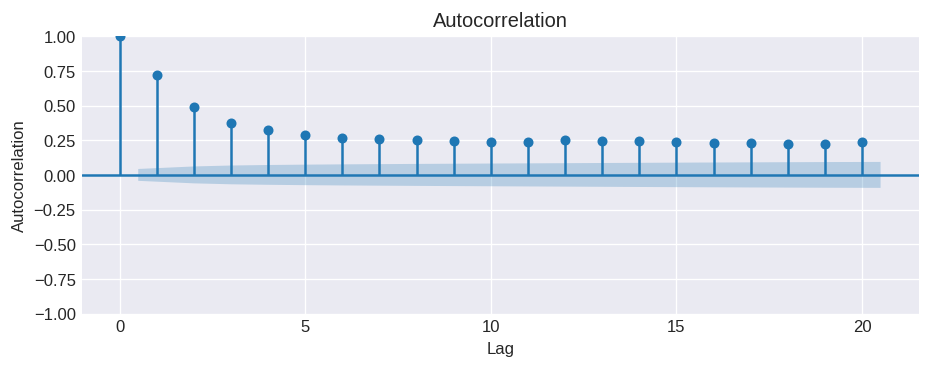

In [ ]:
from statsmodels.graphics.tsaplots import plot_acf
plot_acf(wind_power, lags=20)
plt.xlabel('Lag')
plt.ylabel('Autocorrelation')
plt.show()

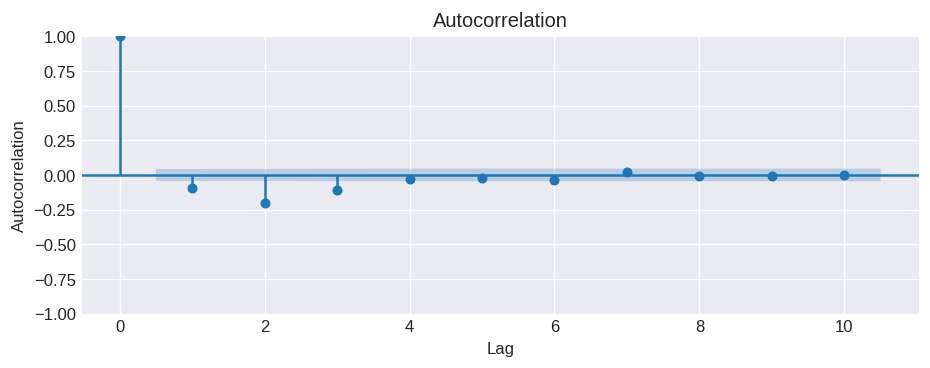

In [ ]:
from statsmodels.graphics.tsaplots import plot_acf
plot_acf(wind_power.diff().dropna(), lags=10)
plt.xlabel('Lag')
plt.ylabel('Autocorrelation')
plt.show()

## Train and test

In [ ]:
wind_power.shape

(2101,)

In [ ]:
test_number = 274
train_w = wind_power[:-test_number]
test_w = wind_power[-test_number:]

In [ ]:
from statsmodels.tsa.statespace.sarimax import SARIMAX

model_s = SARIMAX(train_w, order=(3,0,5), seasonal_order=(3,0,5,12),
                enforce_stationarity=False,
                enforce_invertibility=False,
                trend="t") # order of _ for AR, 1 differentiation, and _ for MA
model_fit_s = model_s.fit(maxiter=2000)

print('Coefficients: %s' % model_fit_s.params)

Coefficients: drift       6.146999e-02
ar.L1       1.415996e+00
ar.L2      -4.294786e-01
ar.L3       9.666474e-03
ma.L1      -6.960629e-01
ma.L2      -1.935212e-01
ma.L3      -4.175382e-02
ma.L4       2.798400e-02
ma.L5      -4.464979e-02
ar.S.L12   -5.475443e-01
ar.S.L24    4.364180e-03
ar.S.L36    9.411061e-02
ma.S.L12    5.577595e-01
ma.S.L24    2.581045e-02
ma.S.L36   -3.530829e-02
ma.S.L48    2.164655e-02
ma.S.L60    4.289615e-02
sigma2      3.146517e+07
dtype: float64


RMSE:  8842.481139993542


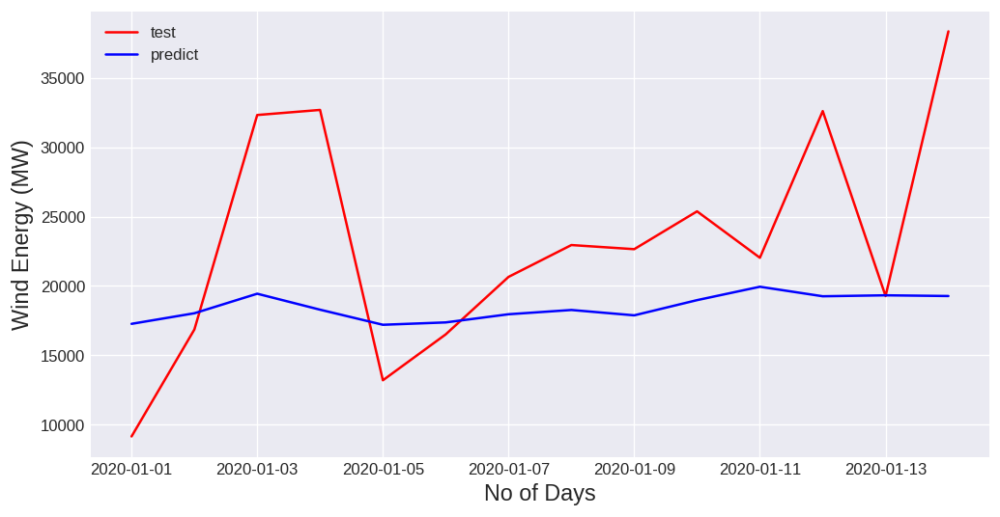

In [ ]:
from sklearn.metrics import mean_squared_error
from math import sqrt

predictions = model_fit_s.predict(start=len(train_w), end=len(train_w)+len(test_w)-1, typ="levels", index= test_w.index)

print("RMSE: ", sqrt(mean_squared_error(test_w[:14], predictions[:14])))
plt.figure(figsize=(10,5))
plt.ylabel("Wind Energy (MW)", fontsize=14)  # X-axis label
plt.xlabel("No of Days", fontsize=14)
plt.plot(test_w[:14], c="red", label="test")
plt.plot(predictions[:14], c="blue", label="predict")
plt.legend()
plt.show();

RMSE:  8842.481139993542


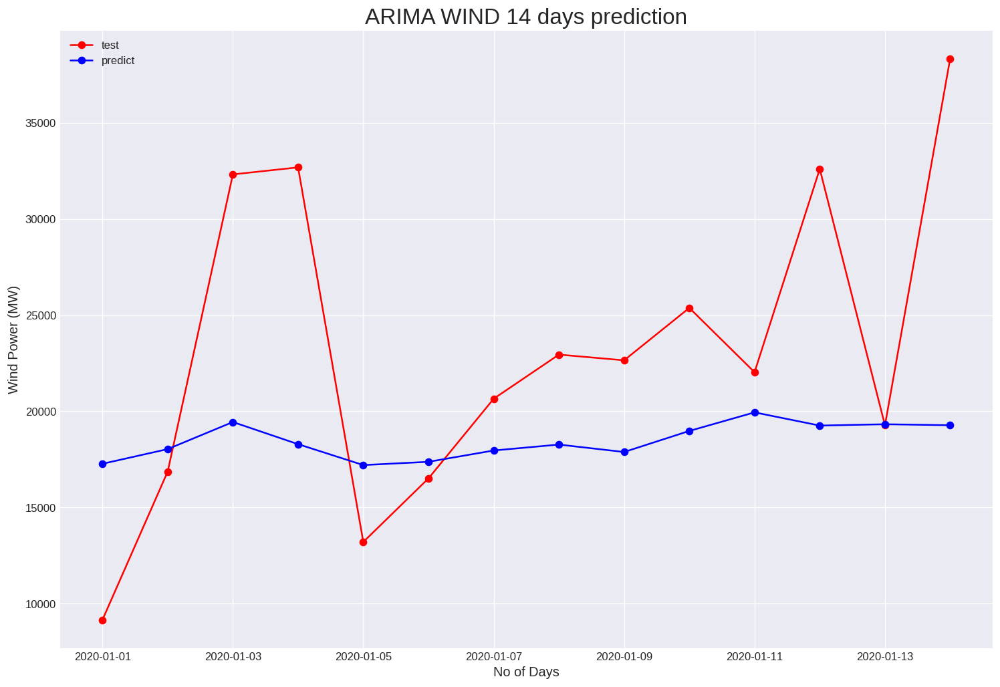

In [ ]:
from sklearn.metrics import mean_squared_error
from math import sqrt

predictions = model_fit_s.predict(start=len(train_w), end=len(train_w)+len(test_w)-1, typ="levels", index= test_w.index)

print("RMSE: ", sqrt(mean_squared_error(test_w[:14], predictions[:14])))
plt.figure(figsize=(15,10))
plt.title('ARIMA WIND 14 days prediction', fontsize=(20))
plt.ylabel("Wind Power (MW)", fontsize=12)  # X-axis label
plt.xlabel("No of Days", fontsize=12)
plt.plot(test_w[:14], c="red", label="test", marker='o')
plt.plot(predictions[:14], c="blue", label="predict", marker='o')
plt.legend()
plt.show();

In [ ]:
from sklearn.metrics import mean_absolute_error
print("MAE: ", mean_absolute_error(test_w[:14], predictions[:14]))

MAE:  6747.109442642347


In [ ]:
from sklearn.metrics import r2_score
r2 = r2_score(test_w[:14], predictions[:14])
print("R-squared Score: ", r2)

R-squared Score:  -0.21586612341916211


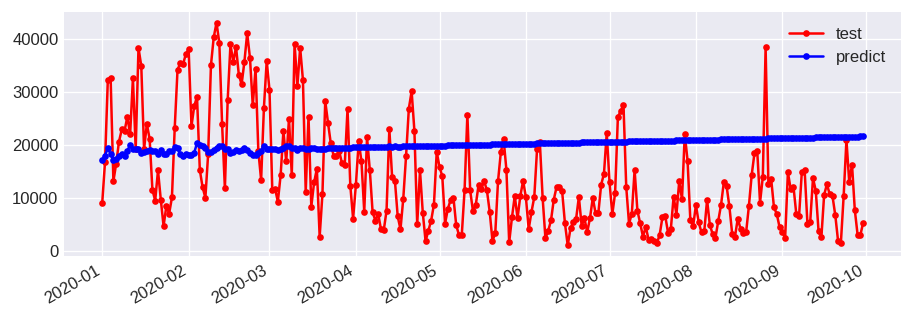

In [ ]:
# make prediction
predictions = model_fit_s.predict(start=len(train_w), end=len(train_w)+len(test_w)-1, typ="levels", index=test_w.index)

fig = plt.figure()
plt.plot(test_w, c="red", label="test", marker='.')
plt.plot(predictions, c="blue", label="predict", marker='.')
plt.legend()
fig.autofmt_xdate()
plt.show();

In [ ]:
best_MAE = float('inf')
for p in range(1, 10):
    for d in range(0, 4):
        for q in range(1, 10):

            print(f"Trying values of {(p, d, q)}", end="\r")

            try:
                # Create SARIMAX model
                model = SARIMAX(train_w, order=(p, d, q),
                               enforce_stationarity=False,
                               enforce_invertibility=False,
                               trend="t")

                # Fit the model with error handling
                model_fit = model.fit(maxiter=2000, disp=False)  # Suppress convergence warnings

                # Predict on the test set
                predictions = model_fit.predict(start=len(train_w),
                                               end=len(train_w) + len(test_w) - 1,
                                               typ="levels",
                                               index=test_w.index)

                current_MAE = mean_absolute_error(test_w[:14], predictions[:14])

                if current_MAE < best_MAE:
                    best_MAE = current_MAE
                    print(f"Found new best MAE of {best_MAE} with values {(p, d, q)}")
                    best_model = model_fit  # Store the best model

            except (np.linalg.LinAlgError, ValueError) as e:
                print(f"Error with {(p, d, q)}: {e}")  # Print error message for debugging
                continue  # Skip to the next iteration if an error occurs

# ... (Rest of your code for evaluation and visualization using best_model) ...

Found new best MAE of 7182.2931971354765 with values (1, 0, 1)
Found new best MAE of 7173.413994040898 with values (1, 0, 2)
Found new best MAE of 7064.346977905751 with values (1, 0, 3)
Found new best MAE of 6083.428167190335 with values (1, 2, 3)
Found new best MAE of 6033.219530404975 with values (1, 2, 9)
Found new best MAE of 6025.6998087817565 with values (2, 2, 9)


# F-Prophet

In [ ]:
# the same steps need to be taken as we did with solar power.
dfw = pd.DataFrame(wind_power)
dfw

,DE_wind_generation_actual
utc_timestamp,
2014-12-31 00:00:00+00:00,8000.000000
2015-01-01 00:00:00+00:00,13548.541667
2015-01-02 00:00:00+00:00,25148.083333
2015-01-03 00:00:00+00:00,19289.791667
2015-01-04 00:00:00+00:00,16042.625000
...,...
2020-09-26 00:00:00+00:00,16333.916667
2020-09-27 00:00:00+00:00,7771.750000
2020-09-28 00:00:00+00:00,3083.833333


In [ ]:
dfw['ds'] = wind_power.index


In [ ]:
dfw

,DE_wind_generation_actual,ds
utc_timestamp,,
2014-12-31 00:00:00+00:00,8000.000000,2014-12-31 00:00:00+00:00
2015-01-01 00:00:00+00:00,13548.541667,2015-01-01 00:00:00+00:00
2015-01-02 00:00:00+00:00,25148.083333,2015-01-02 00:00:00+00:00
2015-01-03 00:00:00+00:00,19289.791667,2015-01-03 00:00:00+00:00
2015-01-04 00:00:00+00:00,16042.625000,2015-01-04 00:00:00+00:00
...,...,...
2020-09-26 00:00:00+00:00,16333.916667,2020-09-26 00:00:00+00:00
2020-09-27 00:00:00+00:00,7771.750000,2020-09-27 00:00:00+00:00
2020-09-28 00:00:00+00:00,3083.833333,2020-09-28 00:00:00+00:00


In [ ]:
dfw['ds'] = pd.to_datetime(dfw['ds']).apply(lambda x: dt.datetime.strftime(x,'%Y-%m-%d'))
dfw['ds'] = pd.to_datetime(dfw['ds'])

In [ ]:
dfw =dfw.reset_index(drop=True)
dfw

,DE_wind_generation_actual,ds
0,8000.000000,2014-12-31
1,13548.541667,2015-01-01
2,25148.083333,2015-01-02
3,19289.791667,2015-01-03
4,16042.625000,2015-01-04
...,...,...
2096,16333.916667,2020-09-26
2097,7771.750000,2020-09-27
2098,3083.833333,2020-09-28
2099,3050.583333,2020-09-29


In [ ]:
dfw.rename(columns={'DE_wind_generation_actual': 'y'},inplace=True)

In [ ]:
dfw.head()

,y,ds
0,8000.000000,2014-12-31
1,13548.541667,2015-01-01
2,25148.083333,2015-01-02
3,19289.791667,2015-01-03
4,16042.625000,2015-01-04


(2101, 2)


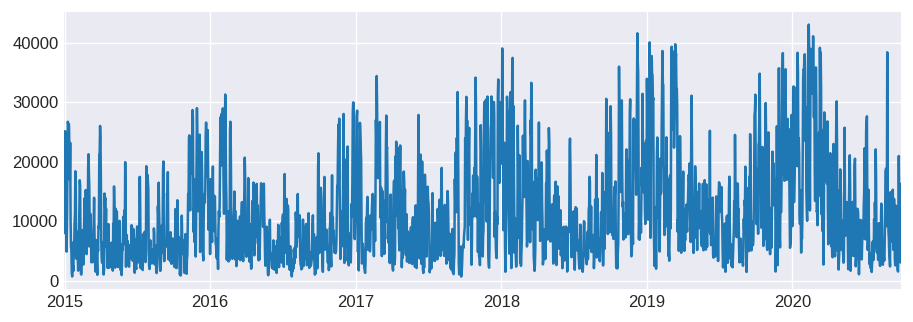

In [ ]:
print(dfw.shape)
plt.figure()
plt.plot(dfw['ds'], dfw['y'])
plt.autoscale(enable=True, axis='x', tight=True)
plt.show();

In [ ]:

train = dfw.loc[dfw.ds.dt.year < 2020,:]
test = dfw.loc[dfw.ds.dt.year >= 2020, :]

print(train.shape, test.shape)


(1827, 2) (274, 2)


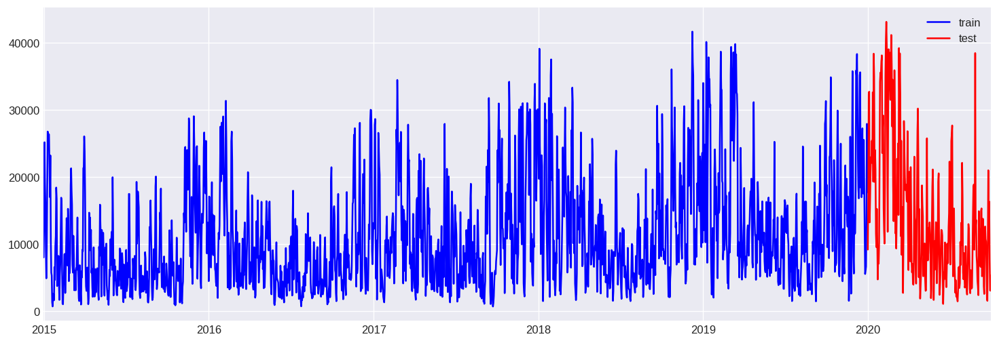

In [ ]:
plt.figure(figsize=(15,5))
plt.plot(train['ds'],train['y'].values, c="blue", label="train")
plt.plot(test['ds'], test['y'].values, c="red", label="test")
plt.autoscale(enable=True, axis='x', tight=True)
plt.legend()
plt.show();

In [ ]:
model = Prophet(interval_width=0.95)
model.fit(train)

INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpbe7octaw/zzin8cgv.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpbe7octaw/_vermodc.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=8086', 'data', 'file=/tmp/tmpbe7octaw/zzin8cgv.json', 'init=/tmp/tmpbe7octaw/_vermodc.json', 'output', 'file=/tmp/tmpbe7octaw/prophet_modelhdwf9a7u/prophet_model-20250221090633.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
09:06:33 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
09:06:33 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


In [ ]:
# Use this prediction model to compare to the ARIMA Model
prediction_df = model.predict(test[:14])
prediction_df = prediction_df[['ds','yhat', 'yhat_lower', 'yhat_upper']]

In [ ]:

future = model.make_future_dataframe(periods=274, freq='D', include_history=False)


In [ ]:
test.tail()

,y,ds
2096,16333.916667,2020-09-26
2097,7771.750000,2020-09-27
2098,3083.833333,2020-09-28
2099,3050.583333,2020-09-29
2100,5334.625000,2020-09-30


In [ ]:
forecast = model.predict(future)
forecast[['ds', 'yhat', 'yhat_lower', 'yhat_upper']].head()

,ds,yhat,yhat_lower,yhat_upper
0,2020-01-01,21558.439316,8140.522531,35226.189339
1,2020-01-02,21368.856768,7871.511196,34838.880711
2,2020-01-03,20650.526228,7851.386340,34519.753580
3,2020-01-04,21307.365554,7397.033463,33764.280625
4,2020-01-05,21230.385297,7938.424243,35601.493183


In [ ]:
from prophet.plot import plot_plotly, plot_components_plotly
import plotly.offline as py
py.init_notebook_mode()

fig = plot_plotly(model, forecast)  # This returns a plotly Figure
py.iplot(fig)

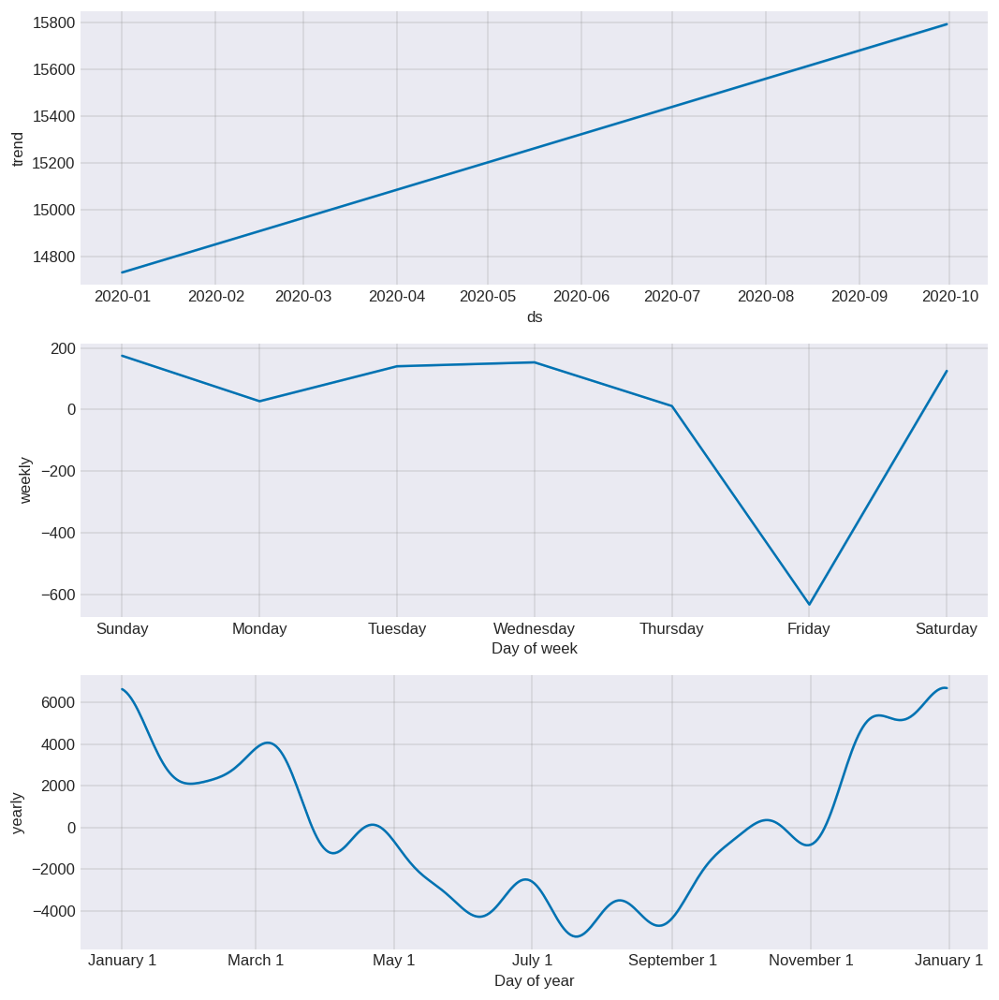

In [ ]:
model.plot_components(forecast);

In [ ]:
plot_components_plotly(model, forecast)

In [ ]:
print("MAE: ", mean_absolute_error(test['y'][:14], forecast['yhat'][:14]))

MAE:  6931.329324841102


In [ ]:
print("RMSE: ", sqrt(mean_squared_error(test['y'][:14], forecast['yhat'][:14])))

RMSE:  8857.061606453304


In [ ]:
r2 = r2_score(test['y'][:14], forecast['yhat'][:14])
print("R-squared Score:", r2)

R-squared Score: -0.21987913985967178


These results are not good. I see a lot of underfitting and I think we need to do more some transformation with our data

### Improve Base Wind Model

(2101, 2)


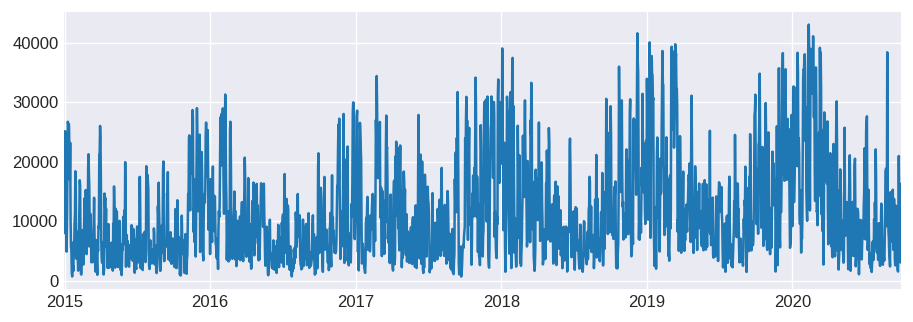

In [ ]:
print(dfw.shape)
plt.figure()
plt.plot(dfw['ds'], dfw['y'])
plt.autoscale(enable=True, axis='x', tight=True)
plt.show();

In [ ]:
dfw['cap'] = 44000 # for logistic growth
dfw.cap = np.cbrt(dfw.cap) # for logistic growth you need to set a cap
dfw.y = np.cbrt(dfw.y)

In [ ]:
train = dfw.loc[dfw.ds.dt.year < 2020,:]
test = dfw.loc[dfw.ds.dt.year >= 2020, :]

In [ ]:
#F-PROPHET
model = Prophet( growth = 'logistic',
                interval_width=0.95,
                changepoint_range=.6,
                daily_seasonality=False,
                changepoint_prior_scale=0.05,
                seasonality_prior_scale=11,
                yearly_seasonality=150,)
model.fit(train)

DEBUG:cmdstanpy:input tempfile: /tmp/tmpbe7octaw/jdti19g1.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpbe7octaw/uegqj1z4.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=70033', 'data', 'file=/tmp/tmpbe7octaw/jdti19g1.json', 'init=/tmp/tmpbe7octaw/uegqj1z4.json', 'output', 'file=/tmp/tmpbe7octaw/prophet_modelhg13pj82/prophet_model-20250221090653.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
09:06:53 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
09:06:53 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


In [ ]:
# Use this prediction model to compare to the ARIMA Model
prediction_df = model.predict(test[:14])
prediction_df = prediction_df[['ds','yhat', 'yhat_lower', 'yhat_upper']]

In [ ]:
future = model.make_future_dataframe(periods=274, freq='D', include_history=False)
future['cap'] = 50000
future.cap = np.cbrt(future.cap)
forecast = model.predict(future)
forecast[['ds', 'yhat', 'yhat_lower', 'yhat_upper']].head()

,ds,yhat,yhat_lower,yhat_upper
0,2020-01-01,28.715959,20.411084,36.742786
1,2020-01-02,31.618990,23.439240,39.794302
2,2020-01-03,30.026308,21.731327,37.964126
3,2020-01-04,31.653240,23.454909,39.884727
4,2020-01-05,30.624292,22.375260,38.012752


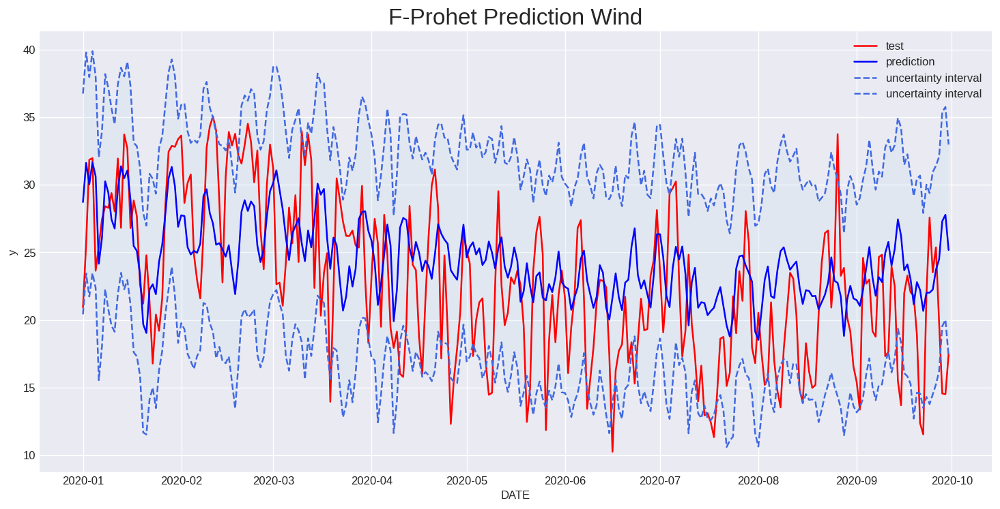

In [ ]:
plt.figure(figsize=(15,7))
plt.plot(test['ds'], test['y'].values, c="red", label="test")
plt.plot(test['ds'], forecast['yhat'].values, c="blue", label="prediction")
plt.plot(test['ds'], forecast['yhat_lower'].values, c="royalblue", label="uncertainty interval", linestyle='--')
plt.plot(test['ds'], forecast['yhat_upper'].values, c="royalblue", label="uncertainty interval", linestyle='--')
ax = plt.gca()
ax.fill_between(test['ds'],  forecast['yhat_lower'], forecast['yhat_upper'], facecolor='lightblue', alpha=0.15, interpolate=True)
plt.title('F-Prohet Prediction Wind', fontsize=20)
plt.ylabel('y')
plt.xlabel('DATE')

plt.legend()
plt.show();

ax.autoscale(enable=True, axis='x', tight=True)
ax.xaxis.set_major_formatter(DateFormatter("%Y %b"))

In [ ]:
# turn values back back to original

train.y = train.y**3
test.y = test.y**3
forecast.yhat = forecast.yhat**3
forecast.yhat_lower = forecast.yhat_lower**3
forecast.yhat_upper = forecast.yhat_upper**3

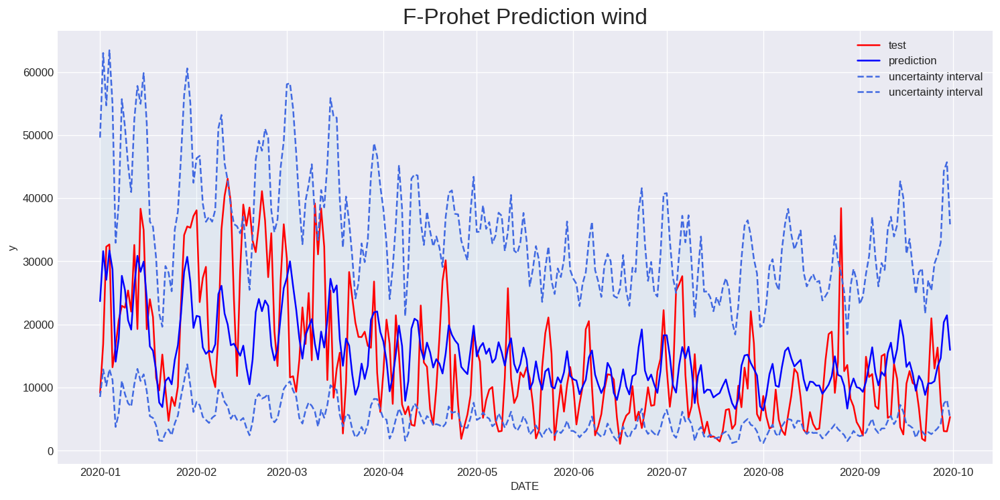

In [ ]:
plt.figure(figsize=(15,7))
plt.plot(test['ds'], test['y'].values, c="red", label="test")
plt.plot(test['ds'], forecast['yhat'].values, c="blue", label="prediction")
plt.plot(test['ds'], forecast['yhat_lower'].values, c="royalblue", label="uncertainty interval", linestyle='--')
plt.plot(test['ds'], forecast['yhat_upper'].values, c="royalblue", label="uncertainty interval", linestyle='--')
ax = plt.gca()
ax.fill_between(test['ds'],  forecast['yhat_lower'], forecast['yhat_upper'], facecolor='lightblue', alpha=0.15, interpolate=True)
plt.title('F-Prohet Prediction wind', fontsize=20)
plt.ylabel('y')
plt.xlabel('DATE')
plt.legend()
plt.show();

ax.autoscale(enable=True, axis='x', tight=True)
ax.xaxis.set_major_formatter(DateFormatter("%Y %b"))

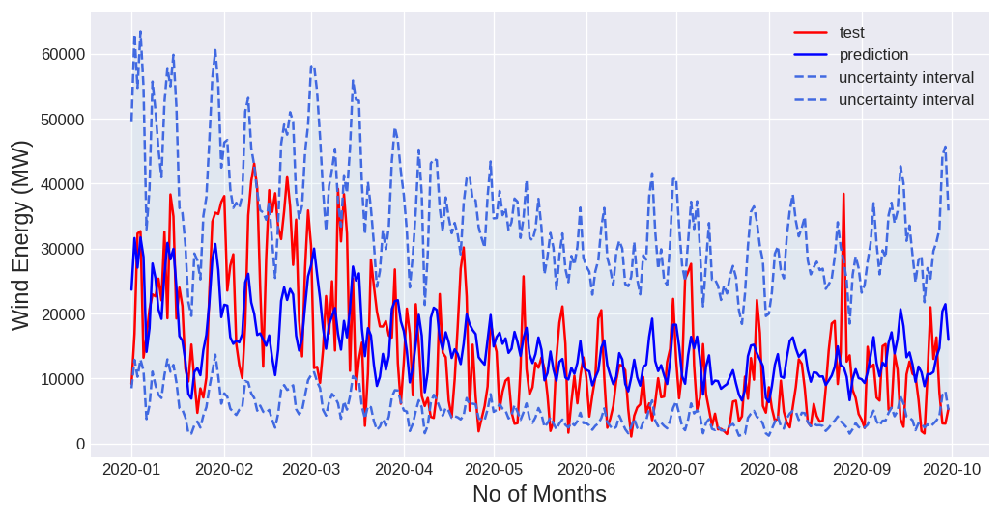

In [ ]:
plt.figure(figsize=(10,5))
plt.plot(test['ds'], test['y'].values, c="red", label="test")
plt.plot(test['ds'], forecast['yhat'].values, c="blue", label="prediction")
plt.plot(test['ds'], forecast['yhat_lower'].values, c="royalblue", label="uncertainty interval", linestyle='--')
plt.plot(test['ds'], forecast['yhat_upper'].values, c="royalblue", label="uncertainty interval", linestyle='--')
ax = plt.gca()
ax.fill_between(test['ds'],  forecast['yhat_lower'], forecast['yhat_upper'], facecolor='lightblue', alpha=0.15, interpolate=True)
plt.ylabel("Wind Energy (MW)", fontsize=14)  # X-axis label
plt.xlabel("No of Months", fontsize=14)
plt.legend()
plt.show();

ax.autoscale(enable=True, axis='x', tight=True)
ax.xaxis.set_major_formatter(DateFormatter("%Y %b"))

In [ ]:
print("MAE: ", mean_absolute_error(test['y'][:14], forecast['yhat'][:14]))

MAE:  7109.072429500619


In [ ]:
print("RMSE: ", sqrt(mean_squared_error(test['y'][:14], forecast['yhat'][:14])))

RMSE:  8656.336047443543


In [ ]:
r2 = r2_score(test['y'][:14], forecast['yhat'][:14])
print("R-squared Score:", r2)

R-squared Score: -0.16521398802401221


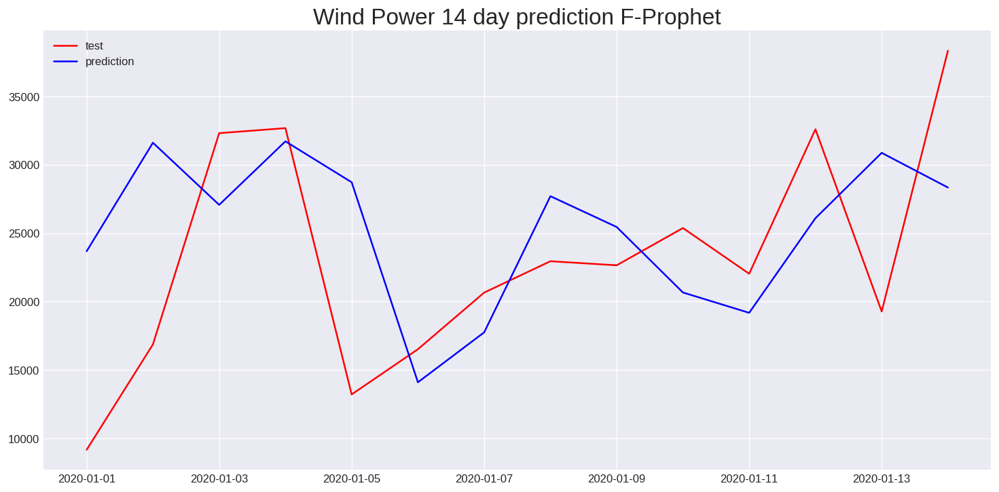

In [ ]:
plt.figure(figsize=(15,7))
plt.plot(test['ds'][:14], test['y'][:14].values, c="red", label="test")
plt.plot(test['ds'][:14], forecast['yhat'][:14].values, c="blue", label="prediction")
plt.title('Wind Power 14 day prediction F-Prophet', fontsize=20)
plt.legend()
plt.show()